# Projet 6 - Etudiez la faisabilité d'un moteur de classification d'articles

In [1]:
%pip install nltk==3.6.5

  Obtaining dependency information for nltk==3.6.5 from https://files.pythonhosted.org/packages/aa/b8/09ac15436591cefc0adc882798d5cf629f13addae0495b20b682219e3afe/nltk-3.6.5-py3-none-any.whl.metadata
  Using cached nltk-3.6.5-py3-none-any.whl.metadata (3.0 kB)
Using cached nltk-3.6.5-py3-none-any.whl (1.5 MB)
  Attempting uninstall: nltk
    Found existing installation: nltk 3.9.1
    Uninstalling nltk-3.9.1:
      Successfully uninstalled nltk-3.9.1
Note: you may need to restart the kernel to use updated packages.


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
evidently 0.7.14 requires nltk>=3.6.7, but you have nltk 3.6.5 which is incompatible.


In [2]:
#%pip install torch
#%pip install tensorflow_hub

In [3]:
# !pip install keras-core --upgrade
# !pip install -q keras-nlp --upgrade

In [4]:
import os, sys
from os import listdir

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import re
import nltk
from nltk.corpus import stopwords
from nltk.corpus import words
from nltk.tokenize import RegexpTokenizer
from nltk.tokenize import word_tokenize, wordpunct_tokenize
from nltk.stem import WordNetLemmatizer, PorterStemmer

# Download NLTK data files
nltk.download('omw-1.4')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('words')
#nltk.download('punkt')

# nltk.data.path.append("C:/Users/cosic/AppData/Roaming/nltk_data")

from glob import glob

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score, auc, roc_auc_score, roc_curve, ConfusionMatrixDisplay, confusion_matrix
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

from transformers import BertTokenizer, BertModel
import torch

import tensorflow_hub as hub

import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Rescaling, RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalAveragePooling1D, Flatten, Dense, Dropout

import keras_core as keras
import keras_nlp

print("TensorFlow version:", tf.__version__)
print("KerasNLP version:", keras_nlp.__version__)

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\cosic\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\cosic\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\cosic\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\cosic\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!



Using TensorFlow backend
TensorFlow version: 2.19.0
KerasNLP version: 0.21.1


In [5]:
sns.set()

## Exploration initiale du dataset

In [6]:
# Load the dataset
file_path = '../Source/Flipkart/flipkart_com-ecommerce_sample_1050.csv'
dataset = pd.read_csv(file_path)

print('DataSet Shape = {}'.format(dataset.shape))
print('DataSet Memory Usage = {:.2f} MB'.format(dataset.memory_usage().sum() / 1024**2))

DataSet Shape = (1050, 15)
DataSet Memory Usage = 0.11 MB


In [7]:
dataset.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [8]:
dataset.tail()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
1045,958f54f4c46b53c8a0a9b8167d9140bc,2015-12-01 10:15:43 +0000,http://www.flipkart.com/oren-empower-extra-lar...,Oren Empower Extra Large Self Adhesive Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE88ZGTX65GH4V,1399.0,999.0,958f54f4c46b53c8a0a9b8167d9140bc.jpg,False,Oren Empower Extra Large Self Adhesive Sticker...,No rating available,No rating available,Oren Empower,"{""product_specification""=>[{""key""=>""Number of ..."
1046,fd6cbcc22efb6b761bd564c28928483c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,Wallmantra Large Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZD5GDCVQ,4930.0,1896.0,fd6cbcc22efb6b761bd564c28928483c.jpg,False,Wallmantra Large Vinyl Sticker Sticker (Pack o...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1047,5912e037d12774bb73a2048f35a00009,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-extra-large-p...,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE5UVGW2JWVWCT,4500.0,1449.0,5912e037d12774bb73a2048f35a00009.jpg,False,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,No rating available,No rating available,Uberlyfe,"{""product_specification""=>[{""key""=>""Number of ..."
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-medium-viny...,Wallmantra Medium Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZGFD3RCE,3465.0,1333.0,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,False,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1049,f2f027ad6a6df617c9f125173da71e44,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-large-vinyl-s...,Uberlyfe Large Vinyl Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE2ZEPACRQJKH7,1190.0,595.0,f2f027ad6a6df617c9f125173da71e44.jpg,False,Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...,4,4,Uberlyfe,"{""product_specification""=>[{""key""=>""Sales Pack..."


In [9]:
dataset.sample(10)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
495,40efb9474b44fba54b5d2a8df121d727,2016-01-07 05:50:25 +0000,http://www.flipkart.com/sonata-7007yl08-watch/...,Sonata 7007YL08 Watch,"[""Watches >> Wrist Watches >> Sonata Wrist Wat...",WATDZ2ZQPXHZYQZJ,849.0,849.0,40efb9474b44fba54b5d2a8df121d727.jpg,False,Sonata 7007YL08 Watch - Buy Sonata 7007YL08 Wa...,No rating available,No rating available,NaN,"{""product_specification""=>{""key""=>""Style Code""..."
850,fc009e0b404034e5ea065ba980917f33,2015-12-29 05:07:38 +0000,http://www.flipkart.com/techone-portable-power...,"Techone+ Portable Power Bank, and Laptops_2 se...","[""Computers >> Laptop Accessories >> USB Gadge...",USGEE5MZ6CAMSUYT,299.0,138.0,fc009e0b404034e5ea065ba980917f33.jpg,False,"Buy Techone+ Portable Power Bank, and Laptops_...",No rating available,No rating available,Techone+,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
340,8963e56482bbd3e9d05e0709d61ee0ca,2015-12-01 06:13:00 +0000,http://www.flipkart.com/engage-blush-drizzle-c...,Engage Blush and Drizzle Combo Set,"[""Beauty and Personal Care >> Fragrances >> De...",CAGE68FFYRMDRF3X,360.0,350.0,8963e56482bbd3e9d05e0709d61ee0ca.jpg,False,Flipkart.com: Buy Engage Blush and Drizzle Com...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Number of ..."
239,8f41774c16a931d71fcf01f8fee171e0,2015-12-01 12:40:44 +0000,http://www.flipkart.com/ruchiworld-marble-pot-...,Ruchiworld Marble Pot Showpiece - 4 cm,"[""Home Decor & Festive Needs >> Showpieces >> ...",SHIECH87SYGU7F8A,1950.0,1250.0,8f41774c16a931d71fcf01f8fee171e0.jpg,False,Ruchiworld Marble Pot Showpiece - 4 cm (Ston...,No rating available,No rating available,Ruchiworld,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1042,057836ecde71565f8ebdd576e41fdc96,2015-12-01 10:15:43 +0000,http://www.flipkart.com/walldesign-small-vinyl...,WallDesign Small Vinyl Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE7KFJHGWC7RTY,1500.0,730.0,057836ecde71565f8ebdd576e41fdc96.jpg,False,Buy WallDesign Small Vinyl Sticker for Rs.730 ...,No rating available,No rating available,WallDesign,"{""product_specification""=>[{""key""=>""Number of ..."
109,7cbbe686c4a233e8cf53528748f75223,2016-02-25 00:26:11 +0000,http://www.flipkart.com/remtex-export-cartoon-...,Remtex Export Cartoon Single Dohar Multicolor,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",BLAEG2BDYCYDNW6X,1499.0,524.0,7cbbe686c4a233e8cf53528748f75223.jpg,False,Specifications of Remtex Export Cartoon Single...,No rating available,No rating available,Remtex Export,"{""product_specification""=>[{""key""=>""Sales Pack..."
876,f3dec6a97225941bf9c3213e73943bd3,2015-12-20 08:26:17 +0000,http://www.flipkart.com/textile-india-paisley-...,Textile India Paisley Double Quilts & Comforte...,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",BLAE3WR6ZQFCHFYE,6599.0,3999.0,f3dec6a97225941bf9c3213e73943bd3.jpg,False,Buy Textile India Paisley Double Quilts & Comf...,No rating available,No rating available,Textile India,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
257,40d7d3d1961236dd814e15592fa52994,2015-12-01 12:40:44 +0000,http://www.flipkart.com/unravel-india-showpiec...,Unravel India Showpiece - 16 cm,"[""Home Decor & Festive Needs >> Showpieces >> ...",SHIE2NM4FBBAYP9U,1949.0,1749.0,40d7d3d1961236dd814e15592fa52994.jpg,False,Buy Unravel India Showpiece - 16 cm for Rs.1...,No rating available,No rating available,Unravel India,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
491,964648862f322b2cc153239af04b22ef,2016-01-07 05:50:25 +0000,http://www.flipkart.com/arb-toshiba-dynabook-s...,ARB Toshiba Dynabook SS MX/395LS Compatible Bl...,"[""Computers >> Laptop Accessories >> Batteries...",ACCDY6GVZYHGRRPP,3499.0,1599.0,964648862f322b2cc153239af04b22ef.jpg,False,Buy ARB Toshiba Dyn

## Identifions les categories des produits

In [10]:
dataset['product_category_tree'].unique()

array(['["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]',
       '["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y..."]',
       '["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA..."]',
       '["Home Furnishing >> Bed Linen >> Bedsheets >> SANTOSH ROYAL FASHION Bedsheets >> SANTOSH ROYAL FASHION Cotton Printed King sized ..."]',
       '["Home Furnishing >> Bed Linen >> Bedsheets >> Jaipur Print Bedsheets >> Jaipur Print Cotton Floral King sized Double Bed..."]',
       '["Watches >> Wrist Watches >> Maserati Time Wrist Watches"]',
       '["Watches >> Wrist Watches >> Camerii Wrist Watches"]',
       '["Watches >> Wrist Watches >> T STAR Wrist Watches"]',
       '["Watches >> Wrist Watches >> Alfajr Wrist Watches"]',
       '["Watches >> Wrist Watches >> T

c:\Users\cosic\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 65533 (\N{REPLACEMENT CHARACTER}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


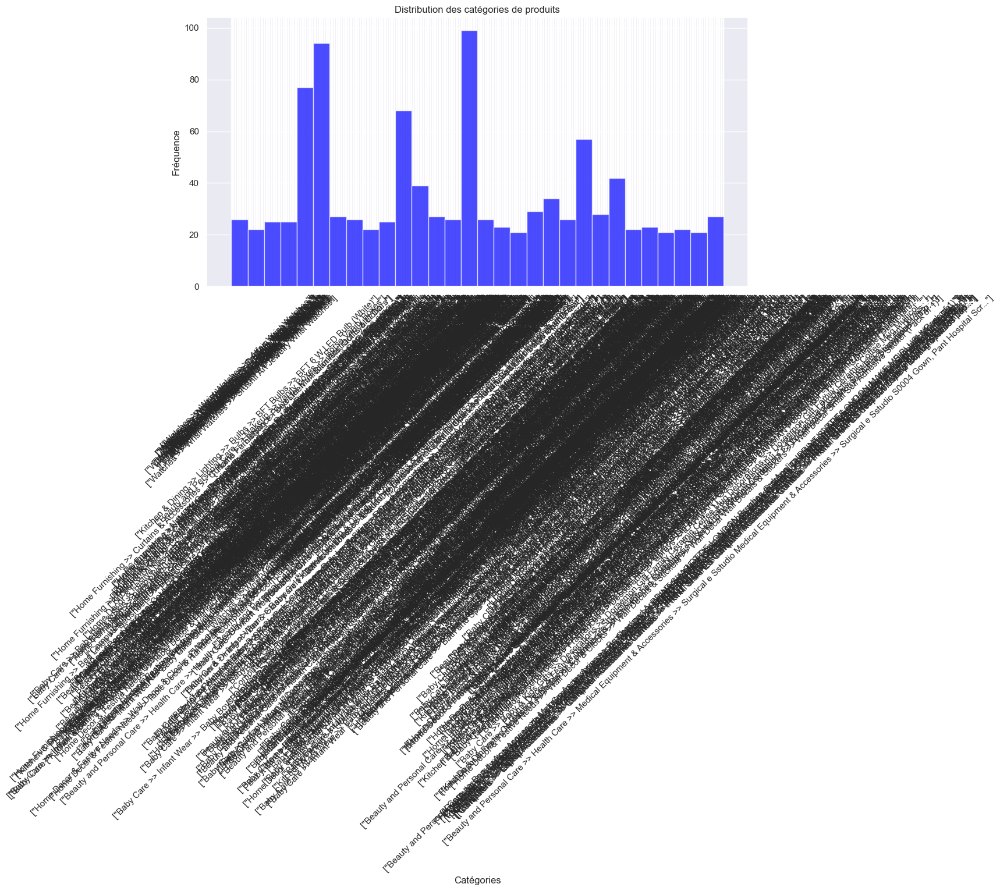

In [11]:
# Histogramme des categories
plt.figure(figsize=(12,6))
plt.hist(dataset['product_category_tree'], bins=30, color='blue', alpha=0.7)
plt.title('Distribution des catégories de produits')
plt.xlabel('Catégories')
plt.ylabel('Fréquence')
plt.xticks(rotation=45)
plt.show()

## La distribution des categories est tres desequilibree

['Home Furnishing', 'Baby Care', 'Watches', 'Home Decor & Festive Needs', 'Kitchen & Dining', 'Beauty and Personal Care', 'Computers']


C:\Users\cosic\AppData\Local\Temp\ipykernel_25904\2088287898.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=category_counts.index, y=category_counts.values, palette='viridis')


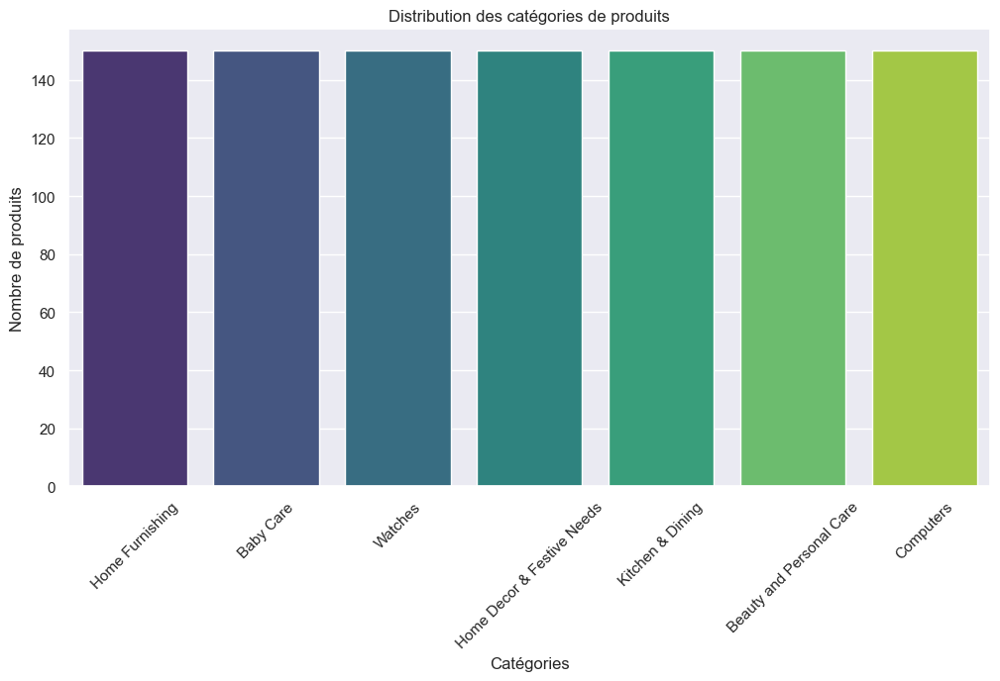

In [12]:
categories = []
for category in dataset['product_category_tree'].unique():
    category = category.split(' >> ')[0].split('["')[1]
    if category not in categories:
        categories.append(category)
print(categories)

# Distribution des catégories
category_counts = dataset['product_category_tree'].apply(lambda x: x.split(' >> ')[0].split('["')[1]).value_counts()
plt.figure(figsize=(12,6))
sns.barplot(x=category_counts.index, y=category_counts.values, palette='viridis')
plt.title('Distribution des catégories de produits')
plt.xlabel('Catégories')
plt.ylabel('Nombre de produits')
plt.xticks(rotation=45)
plt.show()

## Nous constatons que 7 categories sont presentes dans notre jeu de donnees

## Colonnes pertinentes

| Type d'information | Nom de la colonne       | Exemple (ligne 0)                                                                    |
| ------------------ | ----------------------- | ------------------------------------------------------------------------------------ |
| 📄 Texte           | `description`           | Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral... |
| 🖼️ Image (id.jpg)    | `image`                 | 55b85ea15a1536d46b7190ad6fff8ce7.jpg                                                 |
| 🏷️ Catégorie      | `product_category_tree` | \["Home Furnishing >> Curtains & Accessories >> Curtains"]                           |


## Verification de la disponibilite des images

In [13]:
def check_images(dataframe, column_image, folder_images):
    """
    Vérifie la disponibilité des fichiers image dans un dossier.

    Args:
        dataframe (pd.DataFrame): Le DataFrame contenant les noms d'images.
        column_image (str): Le nom de la colonne contenant les noms d'image.
        folder_images (str): Le chemin vers le dossier contenant les images.

    Returns:
        dict: Statistiques sur les images trouvées / manquantes.
        list: Liste des images manquantes.
    """
    avaible_images = set(os.listdir(folder_images))
    waiting_images = set(dataframe[column_image].dropna().unique())

    found_images = waiting_images & avaible_images
    missing_images = list(waiting_images - avaible_images)

    stats = {
        "total_demandées": len(waiting_images),
        "disponibles": len(found_images),
        "manquantes": len(missing_images),
        "pourcentage_disponibles": round(len(found_images) / len(waiting_images) * 100, 2)
    }

    return stats, missing_images

In [14]:
stats, missing_images = check_images(dataset, column_image="image", folder_images="../Source/Flipkart/Images")

In [15]:
stats

{'total_demandées': 1050,
 'disponibles': 1050,
 'manquantes': 0,
 'pourcentage_disponibles': 100.0}

### Nous constatons que l'ensemble des images sont presentes

## Regardons d'un peu plus pres les descriptions

In [16]:
doc = dataset.description.sample(1)
doc = doc.values[0]
doc

'Flipkart.com: Buy Spinz Combo Set online only for Rs. 354 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping. Cash On Delivery!'

### Les descriptions sont quand meme bruitees. Nous avons des mots redondant, des majuscules a chaque mot, des caracteres speciaux ... 

In [17]:
doc = doc.lower()
doc

'flipkart.com: buy spinz combo set online only for rs. 354 from flipkart.com. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!'

In [18]:
tokens = word_tokenize(doc)
tokens

['flipkart.com',
 ':',
 'buy',
 'spinz',
 'combo',
 'set',
 'online',
 'only',
 'for',
 'rs',
 '.',
 '354',
 'from',
 'flipkart.com',
 '.',
 'only',
 'genuine',
 'products',
 '.',
 '30',
 'day',
 'replacement',
 'guarantee',
 '.',
 'free',
 'shipping',
 '.',
 'cash',
 'on',
 'delivery',
 '!']

In [19]:
len(tokens)

31

In [20]:
len(set(tokens))

25

In [21]:
def display_tokens_infos(tokens):
    """
    display information about corpus tokens
    """
    print(f"nb of tokens = {len(tokens)}")
    print(f"nb of unique tokens = {len(set(tokens))}")
    print(f"nb of stopwords = {len([t for t in tokens if t in stopwords.words('english')])}")

In [22]:
display_tokens_infos(tokens)

nb of tokens = 31
nb of unique tokens = 25
nb of stopwords = 5


## Essayons un autre tokenizer

In [23]:
tokenizer = RegexpTokenizer(r'\w+')
tokens = tokenizer.tokenize(doc)
display_tokens_infos(tokens)
print("//")
tokens = [t for t in tokens if t not in stopwords.words('english')]
display_tokens_infos(tokens)

nb of tokens = 26
nb of unique tokens = 23
nb of stopwords = 5
//
nb of tokens = 21
nb of unique tokens = 19
nb of stopwords = 0


### Le RegexTokenizer capture d'une meilleure facon les informations

## Nous allons passer au pretraitement du texte.
### Pour ca je vais creer une fonction qui va tenter de gerer plusieurs elements a partir de ce que nous avons essaye jusqu'alors

In [24]:
def text_cleaning(text, 
                  rejoin=True, 
                  lemm_or_stem='stem', 
                  list_rare_words=None, 
                  min_len_word=3, 
                  eng_words=None, 
                  extra_words=None):
    """
    Nettoie le texte en supprimant les caractères spéciaux, les chiffres, les espaces supplémentaires, et en convertissant le texte en minuscules.

    Args:
        text (str): Le texte à nettoyer.

    Returns:
        str: Le texte nettoyé.
    """
    # liste des mots uniques
    if not list_rare_words:
        list_rare_words = []
    
    # extra words
    if not extra_words:
        extra_words = []
    
    # mettre le text en minuscule
    text = text.lower().strip()

    # suppression des balises HTML
    text = re.sub(r'<.*?>', ' ', text)

    # suppression des caractères spéciaux et des chiffres
    text = re.sub(r'[^a-z\s]', ' ', text)

    # suppression des espaces supplémentaires
    text = re.sub(r'\s+', ' ', text).strip()

    # tokenisation
    tokenizer = RegexpTokenizer(r'\w+')
    raw_tokens_list = tokenizer.tokenize(text)

    # suppression des stopwords
    stop_words = set(stopwords.words('english'))
    clean_tokens_list = [word for word in raw_tokens_list if word not in stop_words]

    # retier les tokens rares
    non_rare_tokens_list = [word for word in clean_tokens_list if word not in list_rare_words]

    # conservation uniquement des  mots de longueur > N
    more_than_N = [word for word in non_rare_tokens_list if len(word) >= min_len_word]

    # conservation uniquement des caractere alpha et non des numériques
    alpha_num = [word for word in more_than_N if word.isalpha()]
    
    # lemmatisation or stemming
    if lemm_or_stem == 'lem':
        lemmanizer = WordNetLemmatizer()
        trans_text = [lemmanizer.lemmatize(word) for word in alpha_num]
    else:
        stemmer = PorterStemmer()
        trans_text = [stemmer.stem(word) for word in alpha_num]
    
    # english
    if eng_words:
        eng_text = [word for word in trans_text if word in eng_words]
    else:
        eng_text = trans_text
    
    # retrait des extra words
    final = [word for word in eng_text if word not in extra_words]
    if rejoin:
        return ' '.join(final)
    
    return eng_text


### Test sur notre 1er doc

In [25]:
text_cleaning(doc)

'flipkart com buy spinz combo set onlin flipkart com genuin product day replac guarante free ship cash deliveri'

### Test sur un echantillon du dataset

In [26]:
echantillon = dataset[['product_name', 'description']].head(5).copy()
echantillon['description_nettoyee'] = echantillon['description'].apply(text_cleaning)

In [27]:
echantillon

,product_name,description,description_nettoyee
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,key featur eleg polyest multicolor abstract ey...
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,specif sathiya cotton bath towel bath towel re...
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,key featur eurospa cotton terri face towel set...
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,key featur santosh royal fashion cotton print ...
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,key featur jaipur print cotton floral king siz...


Text(0, 0.5, 'Fréquence')

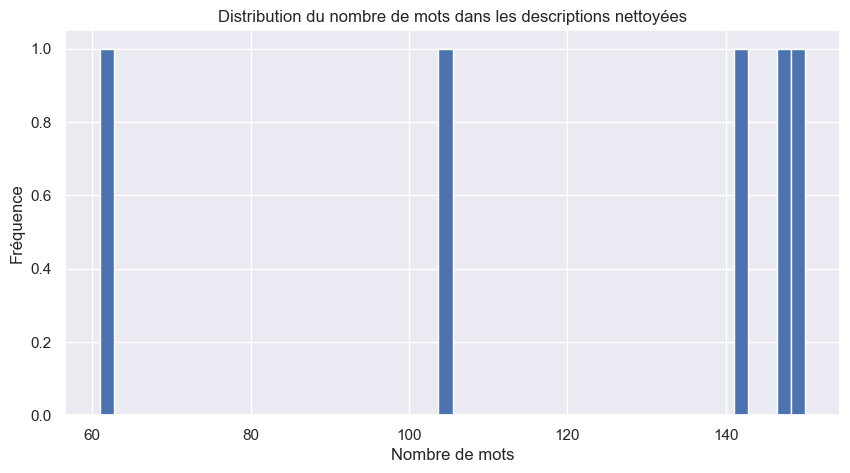

In [28]:
echantillon['description_nettoyee'].apply(lambda x: len(x.split(' '))).describe()
echantillon['description_nettoyee'].apply(lambda x: len(x.split(' '))).hist(bins=50, figsize=(10, 5))
plt.title('Distribution du nombre de mots dans les descriptions nettoyées')
plt.xlabel('Nombre de mots')
plt.ylabel('Fréquence')

## Essayons de traiter le corpus entierement

In [29]:
# assembler tous les corpus
raw_corpus = ' '.join(dataset.description.values)
raw_corpus  # Afficher les 1000 premiers caractères du corpus brut

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

In [30]:
len(raw_corpus)

498561

In [31]:
def process_text(doc, rejoin=False):
    """
    basic function to process text
    """
    doc = doc.lower()
    tokenizer = RegexpTokenizer(r'\w+')
    raw_tokens = tokenizer.tokenize(doc)
    tokens = [t for t in raw_tokens if t not in stopwords.words('english')]
    if rejoin:
        return ' '.join(tokens)
    return tokens

In [32]:
corpus = process_text(raw_corpus)
display_tokens_infos(corpus)

nb of tokens = 61786
nb of unique tokens = 5966
nb of stopwords = 0


In [33]:
corpus

['key',
 'features',
 'elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'floral',
 'curtain',
 'elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 '213',
 'cm',
 'height',
 'pack',
 '2',
 'price',
 'rs',
 '899',
 'curtain',
 'enhances',
 'look',
 'interiors',
 'curtain',
 'made',
 '100',
 'high',
 'quality',
 'polyester',
 'fabric',
 'features',
 'eyelet',
 'style',
 'stitch',
 'metal',
 'ring',
 'makes',
 'room',
 'environment',
 'romantic',
 'loving',
 'curtain',
 'ant',
 'wrinkle',
 'anti',
 'shrinkage',
 'elegant',
 'apparance',
 'give',
 'home',
 'bright',
 'modernistic',
 'appeal',
 'designs',
 'surreal',
 'attention',
 'sure',
 'steal',
 'hearts',
 'contemporary',
 'eyelet',
 'valance',
 'curtains',
 'slide',
 'smoothly',
 'draw',
 'apart',
 'first',
 'thing',
 'morning',
 'welcome',
 'bright',
 'sun',
 'rays',
 'want',
 'wish',
 'good',
 'morning',
 'whole',
 'world',
 'draw',
 'close',
 'evening',
 'create

In [34]:
tmp = pd.Series(corpus).value_counts()
tmp

rs          911
products    631
free        618
buy         581
delivery    567
           ... 
656           1
motif         1
hargunz       1
driver        1
pgrn01        1
Name: count, Length: 5966, dtype: int64

In [35]:
tmp.describe()

count    5966.000000
mean       10.356353
std        39.975073
min         1.000000
25%         1.000000
50%         2.000000
75%         5.000000
max       911.000000
Name: count, dtype: float64

<Axes: ylabel='count'>

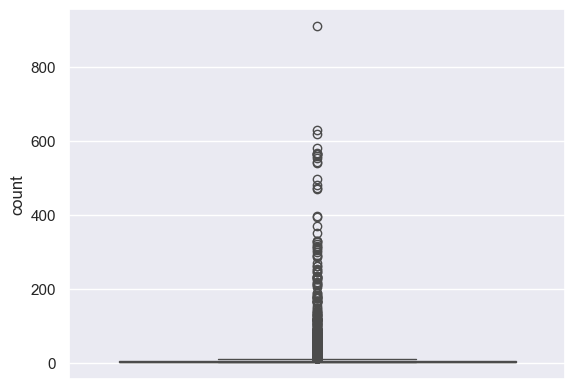

In [36]:
sns.boxplot(tmp)

## Nous allons appliquer notre cleaning sur l'ensemble de nos donnees

Text(0, 0.5, 'Fréquence')

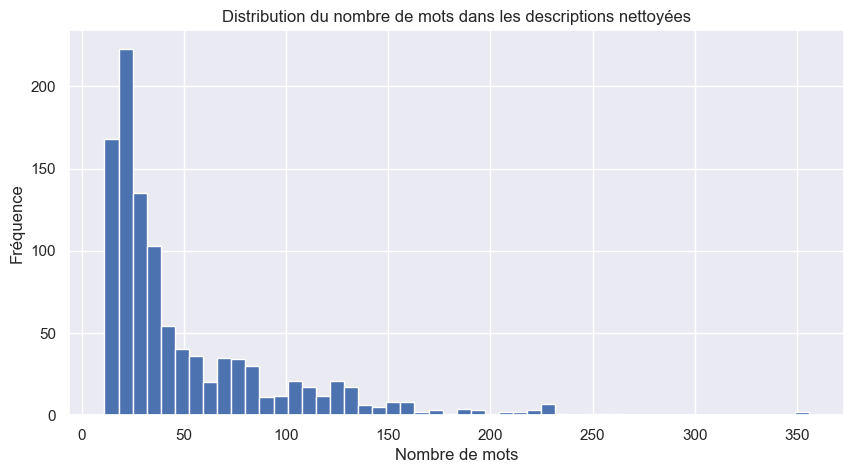

In [37]:
dataset['description_nettoyee_'] = dataset['description'].apply(text_cleaning)
dataset['description_nettoyee_'].apply(lambda x: len(x.split(' '))).describe()
dataset['description_nettoyee_'].apply(lambda x: len(x.split(' '))).hist(bins=50, figsize=(10, 5))
plt.title('Distribution du nombre de mots dans les descriptions nettoyées')
plt.xlabel('Nombre de mots')
plt.ylabel('Fréquence')

### On remarque meme que pour certains textes beaucoup de mots sont presents

# Nous allons passer maintenant a l'extraction des features texte et pour ca je vais utiliser deux approches que je pourrais comparer : type bag of words, comptage simple de mots et tf-idf

## Commencons par BoW - CountVectorizer

### L'objectif est de representer chaque description par un vecteur de comptage du nombre d'occurences de chaque mot dans le texte

In [38]:
# initialisation de notre vectoriseur BoW
vectorizer_bow = CountVectorizer(max_features=1000, stop_words='english')
# transformation de la colonne 'description_nettoyee_' en matrice BoW a partir de tous les mots presents dans le corpus
X_bow = vectorizer_bow.fit_transform(dataset['description_nettoyee_'])
# conversion en DataFrame
X_bow_df = pd.DataFrame(X_bow.toarray(), columns=vectorizer_bow.get_feature_names_out())
# voir le vocabulaire
words_bow = vectorizer_bow.get_feature_names_out()

print(f"Dimension matrice BoW = {X_bow.shape}")

Dimension matrice BoW = (1050, 1000)


In [39]:
X_bow_df

,aapno,abkl,abl,absorb,abstract,accessori,actual,adapt,adaptor,add,...,wool,work,world,woven,wow,wrap,ye,year,yellow,youth
0,0,0,0,0,4,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,2,0
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1046,0,0,0,0,0,0,0,0,0,0,...,0,0,2,0,0,0,0,0,0,0
1047,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1048,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [40]:
words_bow

array(['aapno', 'abkl', 'abl', 'absorb', 'abstract', 'accessori',
       'actual', 'adapt', 'adaptor', 'add', 'addit', 'adhes', 'adjust',
       'ador', 'adorn', 'afford', 'age', 'air', 'akup', 'alarm', 'allin',
       'allow', 'almond', 'aloevera', 'aluminium', 'alway', 'amaz',
       'analog', 'android', 'angel', 'anim', 'anodis', 'anoth', 'anti',
       'antiqu', 'antiqueshop', 'apparel', 'appeal', 'appear', 'appl',
       'appli', 'applic', 'approx', 'arab', 'area', 'aroma', 'art',
       'artifici', 'artisan', 'artist', 'assembl', 'assort', 'assur',
       'asu', 'attach', 'attitud', 'attract', 'audio', 'authent', 'avail',
       'away', 'awesom', 'babi', 'backpack', 'bag', 'band', 'bank', 'bar',
       'base', 'basic', 'bath', 'batteri', 'bazaar', 'beauti', 'bed',
       'bedroom', 'bedsheet', 'beig', 'belt', 'best', 'bharatcraft',
       'big', 'birthday', 'black', 'blade', 'blanket', 'bleach', 'blend',
       'blue', 'bluetooth', 'board', 'bodi', 'bodysuit', 'bonsai',
       'b

In [41]:
def display_barplot(data=None, x=None, y=None, title='Barplot', figsize=(12, 8),
                    order=None, palette='bright', xrotation=0):
    plt.figure(figsize=figsize)
    plt.title(title)
    sns.barplot(data=data, x=x, y=y, order=order, palette=palette)
    plt.xticks(rotation=xrotation)
    plt.show()

In [42]:
def display_bow_by_index(bow_data, index):
    bow = bow_data.iloc[index, :][bow_data.iloc[index, :] > 0]
    display_barplot(x=bow.index, y=bow.values, xrotation=90, figsize=(20, 10),
                    title="BoW of index {} (tokens={})".format(index, len(bow.index)))

## Unigrams

C:\Users\cosic\AppData\Local\Temp\ipykernel_25904\2391282558.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=data, x=x, y=y, order=order, palette=palette)


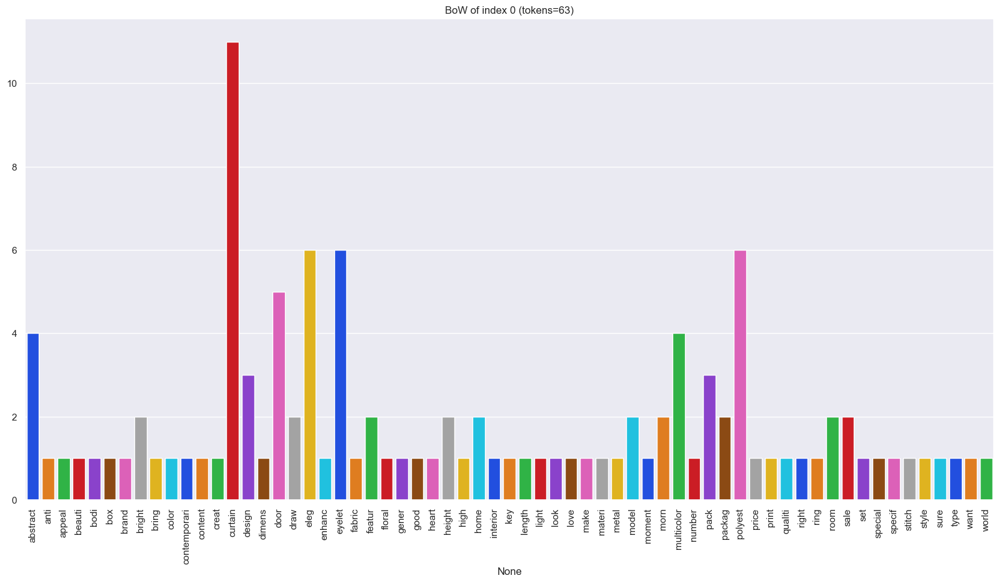

In [43]:
display_bow_by_index(X_bow_df, 0)

## Bigrams

In [44]:
# initialisation de notre vectoriseur BoW
bi_vectorizer_bow = CountVectorizer(max_features=1000, stop_words='english', ngram_range=(2, 2))
# transformation de la colonne 'description_nettoyee_' en matrice BoW a partir de tous les mots presents dans le corpus
bi_X_bow = bi_vectorizer_bow.fit_transform(dataset['description_nettoyee_'])
# conversion en DataFrame
bi_X_bow_df = pd.DataFrame(bi_X_bow.toarray(), columns=bi_vectorizer_bow.get_feature_names_out())
# voir le vocabulaire
bi_words_bow = bi_vectorizer_bow.get_feature_names_out()

print(f"Dimension matrice BoW = {bi_X_bow.shape}")

Dimension matrice BoW = (1050, 1000)


C:\Users\cosic\AppData\Local\Temp\ipykernel_25904\2391282558.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=data, x=x, y=y, order=order, palette=palette)


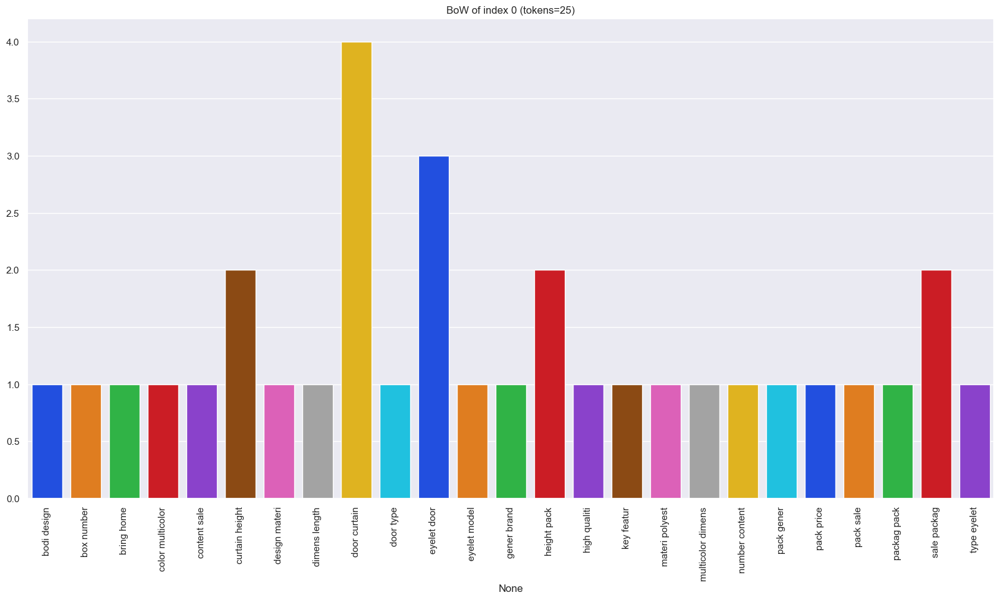

In [45]:
display_bow_by_index(bi_X_bow_df, 0)

## Maintenant essayons une autre methode comme Tf-idf - TfidfVectorizer (Term Frequency – Inverse Document Frequency)

### Comme avec BoW, mais cette fois ci on pondere les mots selon leur importance dans le corpus

In [46]:
# Initialisation de notre vectorizer TF-IDF
vectorizer_tfidf = TfidfVectorizer(max_features=1000, stop_words='english')
# Transformation de la colonne 'description_nettoyee_' en matrice TF-IDF a partir de tous les mots presents dans le corpus
X_tfidf = vectorizer_tfidf.fit_transform(dataset['description_nettoyee_'])
# Conversion en DataFrame
X_tfidf_df = pd.DataFrame(X_tfidf.toarray(), columns=vectorizer_tfidf.get_feature_names_out())
# Voir le vocabulaire
words_tfidf = vectorizer_tfidf.get_feature_names_out()

print(f"Dimension matrice TF-IDF = {X_tfidf.shape}")

Dimension matrice TF-IDF = (1050, 1000)


In [47]:
X_tfidf_df

,aapno,abkl,abl,absorb,abstract,accessori,actual,adapt,adaptor,add,...,wool,work,world,woven,wow,wrap,ye,year,yellow,youth
0,0.0,0.0,0.0,0.000000,0.18697,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.061627,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0
1,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.077398,0.000000,0.197514,0.0
2,0.0,0.0,0.0,0.061451,0.00000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.046642,0.000000,0.0
3,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.044327,0.000000,0.000000,0.0
4,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.036298,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0
1046,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.115219,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0
1047,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0
1048,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0


C:\Users\cosic\AppData\Local\Temp\ipykernel_25904\2391282558.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=data, x=x, y=y, order=order, palette=palette)


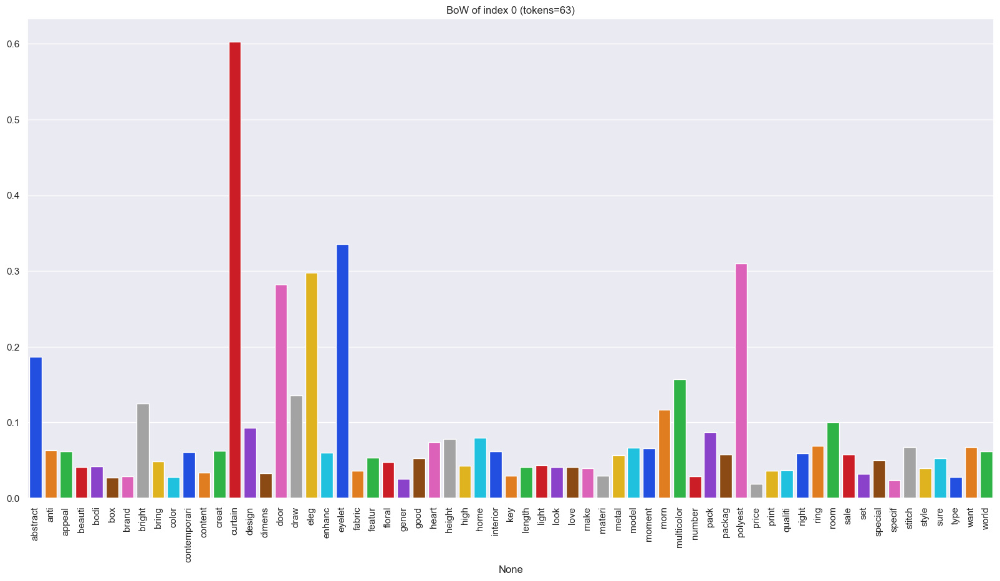

In [48]:
display_bow_by_index(X_tfidf_df, 0)

### essayons de comparer les deux methodes sur les 10 premiers mots

In [49]:
for i in range(10):
    print(f"Mot {i+1:2} BoW : {words_bow[i]:15} | TF-IDF : {words_tfidf[i]}")

Mot  1 BoW : aapno           | TF-IDF : aapno
Mot  2 BoW : abkl            | TF-IDF : abkl
Mot  3 BoW : abl             | TF-IDF : abl
Mot  4 BoW : absorb          | TF-IDF : absorb
Mot  5 BoW : abstract        | TF-IDF : abstract
Mot  6 BoW : accessori       | TF-IDF : accessori
Mot  7 BoW : actual          | TF-IDF : actual
Mot  8 BoW : adapt           | TF-IDF : adapt
Mot  9 BoW : adaptor         | TF-IDF : adaptor
Mot 10 BoW : add             | TF-IDF : add


## A present nous devons tester une autre approche de type word/sentence embedding classique (word2Vec, GloVe, FastText)

### A la difference de Tf-idf ou BoW, ces approches la de type embeddings permettent de :
- #### capturer la semantique, c'est a dire que les mots similaires sont proches dans l'espadce vectoriel
- #### generer des vecteurs continus (reels), et non des vecteurs creux ou binaires
- #### creer des representations de phrases ou de documents en moyennant les vecteurs mots

## Word2Vec - Gensim

In [50]:
#%pip install --upgrade gensim


In [51]:
from gensim.models import Word2Vec

In [52]:
# tokeniser chaque description nettoyée
dataset['tokens_'] = dataset['description_nettoyee_'].apply(word_tokenize)

In [53]:
# entrainer le modele Word2Vec
model_w2v = Word2Vec(sentences=dataset['tokens_'], vector_size=100, window=5, min_count=2, workers=4, sg=1)

In [54]:
# generer un vecteur par description (moyenne des vecteurs de mots)
def get_average_vector(tokens, model):
    """
    Calcule le vecteur moyen pour une liste de tokens en utilisant un modèle Word2Vec.
    """
    if not tokens:
        return np.zeros(model.vector_size)
    
    vectors = [model.wv[word] for word in tokens if word in model.wv]
    if not vectors:
        return np.zeros(model.vector_size)
    
    return np.mean(vectors, axis=0)

In [55]:
dataset["embedding_w2v_"] = dataset['tokens_'].apply(lambda x: get_average_vector(x, model_w2v))
# Afficher les dimensions de l'embedding
print(f"Dimension de l'embedding Word2Vec = {dataset['embedding_w2v_'].iloc[0].shape}")

Dimension de l'embedding Word2Vec = (100,)


In [56]:
dataset["embedding_w2v_"].head()

0    [-0.030595925, 0.16427962, -0.15487988, 0.0518...
1    [-0.045711305, 0.10668839, -0.10166071, -0.044...
2    [-0.033377513, 0.10215161, -0.120750606, -0.01...
3    [-0.13328615, 0.106566824, -0.15751687, -0.052...
4    [-0.12918435, 0.116388865, -0.14137946, -0.042...
Name: embedding_w2v_, dtype: object

In [57]:
dataset["product_category_tree"].apply(lambda x: x.split(" >> ")[0].split('["')[1])

0       Home Furnishing
1             Baby Care
2             Baby Care
3       Home Furnishing
4       Home Furnishing
             ...       
1045          Baby Care
1046          Baby Care
1047          Baby Care
1048          Baby Care
1049          Baby Care
Name: product_category_tree, Length: 1050, dtype: object

### Ici nous avons donc cree 1 vecteur pour chaque description

## Notre nouveau objectif est de realiser une fonction ajustable (pour n'importe quelle methode de vectorisation bow, tfidf, w2v, bert, use..) permettant d'extraire N features de texte (1 vecteur par description) puis appliquer des reductions de dimensionnalite (PCA - T-sne). Appliquer un KMeans sur les donnees reduites, calculer le score ARI entre les clusters KMeans et les categories reelles et enfin visualiser en 2D les points.

In [58]:
def features_retrieval_to_cluster(X_features, dataframe, methode="", n_comp_target=0.95, k_clusters=7):
    """
    Applique PCA + t-SNE + KMeans + ARI + Visualisation 2D sur une matrice de features.

    Args:
        X_features (np.ndarray or sparse matrix): Matrice [n_samples, n_features] issue d'une vectorisation texte.
        dataframe (pd.DataFrame): DataFrame d'origine contenant les catégories réelles.
        methode (str): Nom de la méthode (pour l'affichage).
    """
    print(f"Méthode : {methode}")

    # PCA complète pour visualiser la variance cunulee
    pca_full = PCA().fit(X_features)
    var_cum = np.cumsum(pca_full.explained_variance_ratio_)

    # Plot de la variance cumulée
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(var_cum) + 1), var_cum, marker='o')
    plt.axhline(y=n_comp_target, color='r', linestyle='--')
    plt.title(f'Variance cumulée expliquée - {methode}')
    plt.xlabel('Nombre de composantes principales')
    plt.ylabel('Variance cumulée expliquée')
    plt.tight_layout()
    plt.show()

    # Choix dynamique du n_components pour PCA
    n_comp = np.argmax(var_cum >= n_comp_target) + 1
    print(f"Nombre de composantes principales retenues : {n_comp}")
    print(f"→ {n_comp} composantes suffisent pour {n_comp_target*100:.1f}% de variance.")

    # Appliquer une PCA
    pca = PCA(n_components=n_comp, random_state=42)
    X_pca = pca.fit_transform(X_features)

    print(f"Dimension après PCA : {X_pca.shape}")

    # Appliquer un t-SNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    X_tsne = tsne.fit_transform(X_pca)
    dataframe["tsne_1"] = X_tsne[:, 0]
    dataframe["tsne_2"] = X_tsne[:, 1]

    print(f"Dimension après t-SNE : {X_tsne.shape}")


    # Appliquer KMeans
    kmeans = KMeans(n_clusters=k_clusters, random_state=42)
    dataframe["cluster"] = kmeans.fit_predict(X_pca)

    print(f"Clusters trouvés : {dataframe['cluster'].nunique()}")

    # Calucler l'ARI
    if "category_simple" not in dataframe:
        print("Aucune catégorie réelle pour le calcul de l'ARI.")
        dataframe["category_simple"] = dataframe["product_category_tree"].apply(lambda x: x.split(" >> ")[0].split('["')[1])
    ari = adjusted_rand_score(dataframe["category_simple"], dataframe["cluster"])
    print(f"Score ARI : {ari:.4f}")

    # Visualisation 2D
    plt.figure(figsize=(12, 8))
    sns.scatterplot(data=dataframe, x="tsne_1", y="tsne_2", hue="cluster", palette="tab10", alpha=0.7)
    plt.title(f"t-SNE projection + KMeans Clustering ({methode})")
    plt.legend(title="Clusters", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 8))
    sns.scatterplot(data=dataframe, x="tsne_1", y="tsne_2", hue="category_simple", palette="tab10", alpha=0.7)
    plt.title(f"t-SNE projection + KMeans Clustering ({methode})")
    plt.legend(title="Clusters", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    return ari

## Utilisation avec methode BOW unigrams

Méthode : BoW


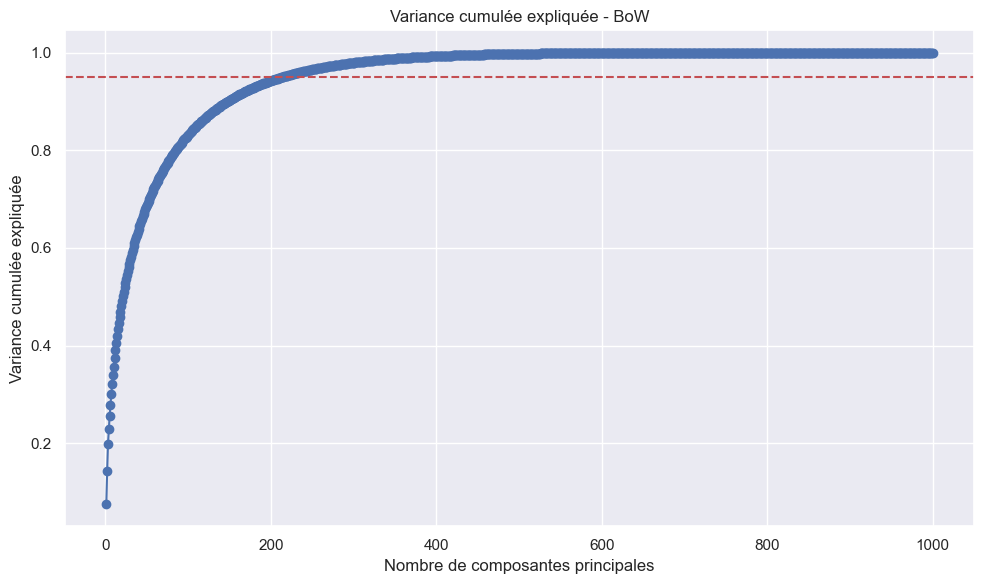

Nombre de composantes principales retenues : 213
→ 213 composantes suffisent pour 95.0% de variance.
Dimension après PCA : (1050, 213)
Dimension après t-SNE : (1050, 2)
Clusters trouvés : 7
Aucune catégorie réelle pour le calcul de l'ARI.
Score ARI : 0.0444


c:\Users\cosic\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


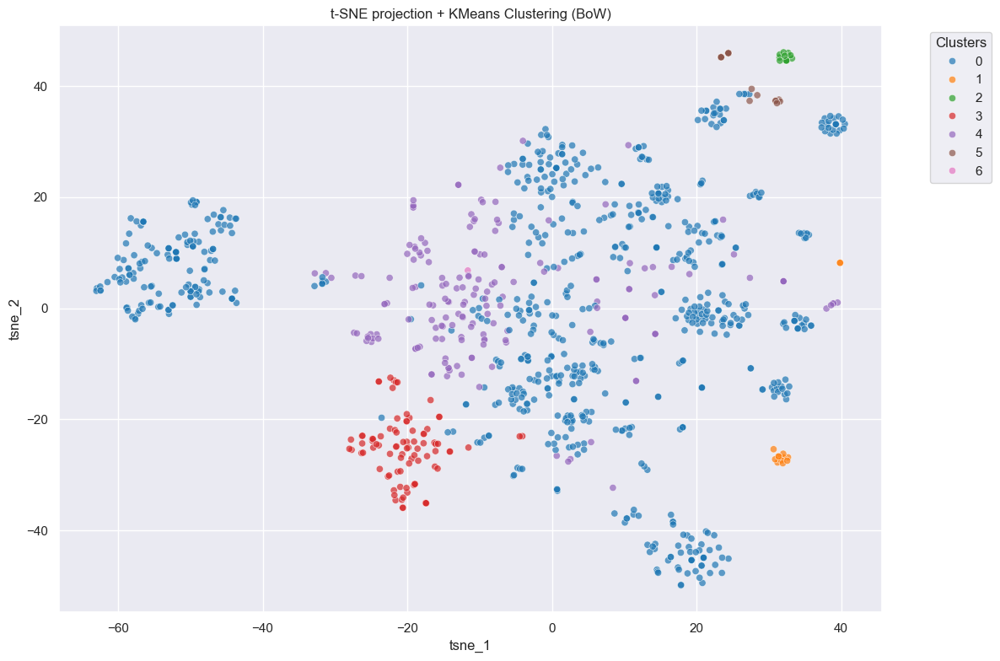

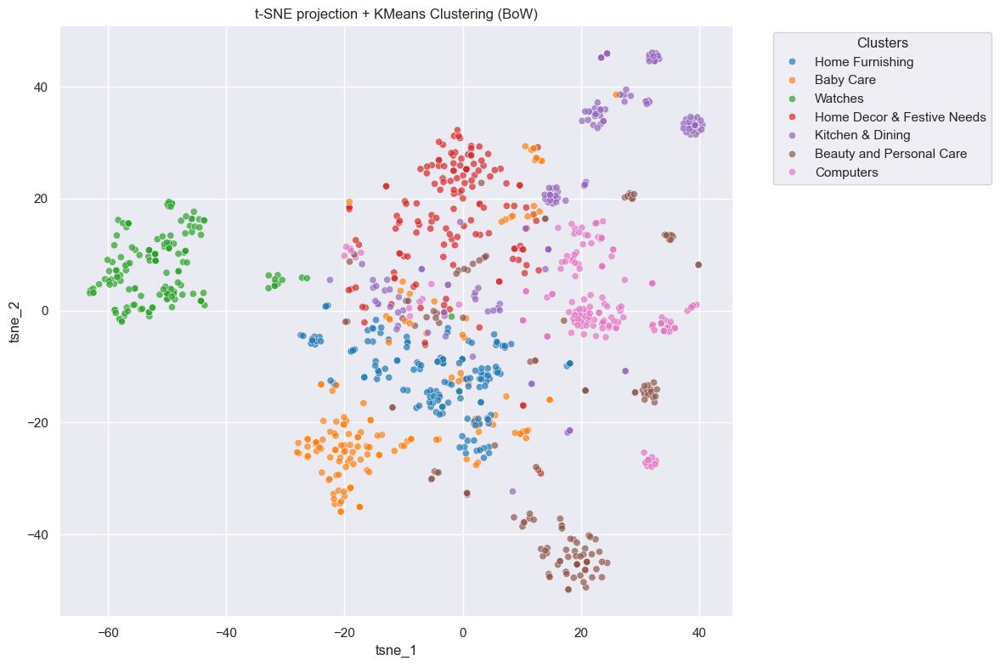

0.04438935498560071

In [59]:
X_BoW = vectorizer_bow.fit_transform(dataset['description_nettoyee_']).toarray()
features_retrieval_to_cluster(X_BoW, dataset.copy(), methode="BoW")


## Utilisation avec methode BOW bigrams

Méthode : BoW


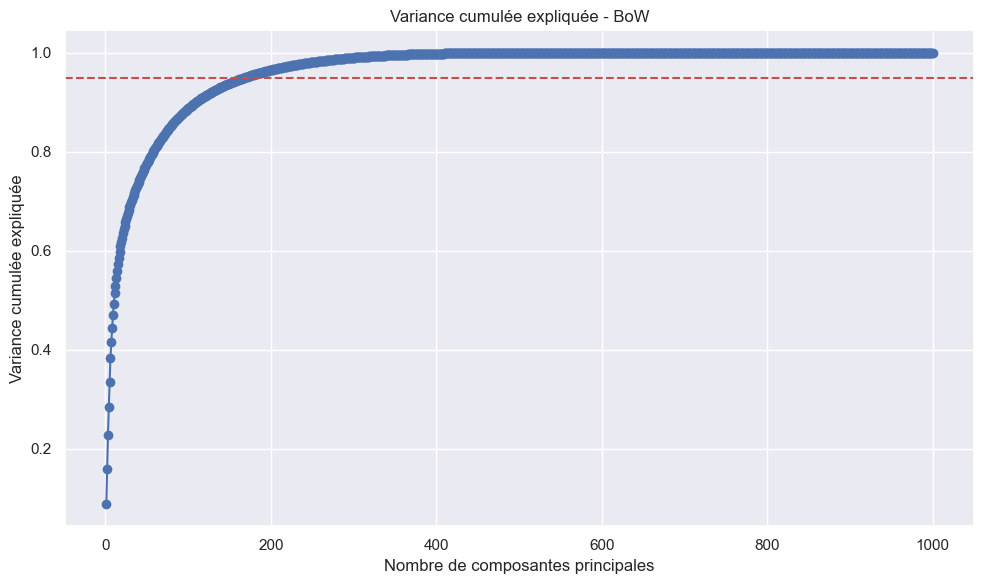

Nombre de composantes principales retenues : 169
→ 169 composantes suffisent pour 95.0% de variance.
Dimension après PCA : (1050, 169)
Dimension après t-SNE : (1050, 2)
Clusters trouvés : 7
Aucune catégorie réelle pour le calcul de l'ARI.
Score ARI : 0.1417


c:\Users\cosic\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


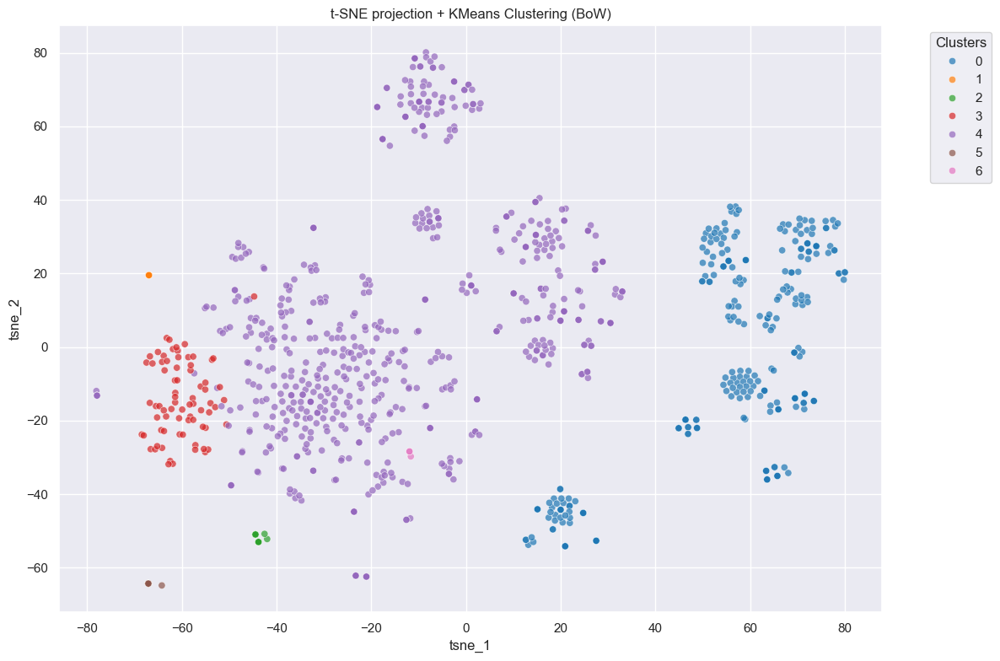

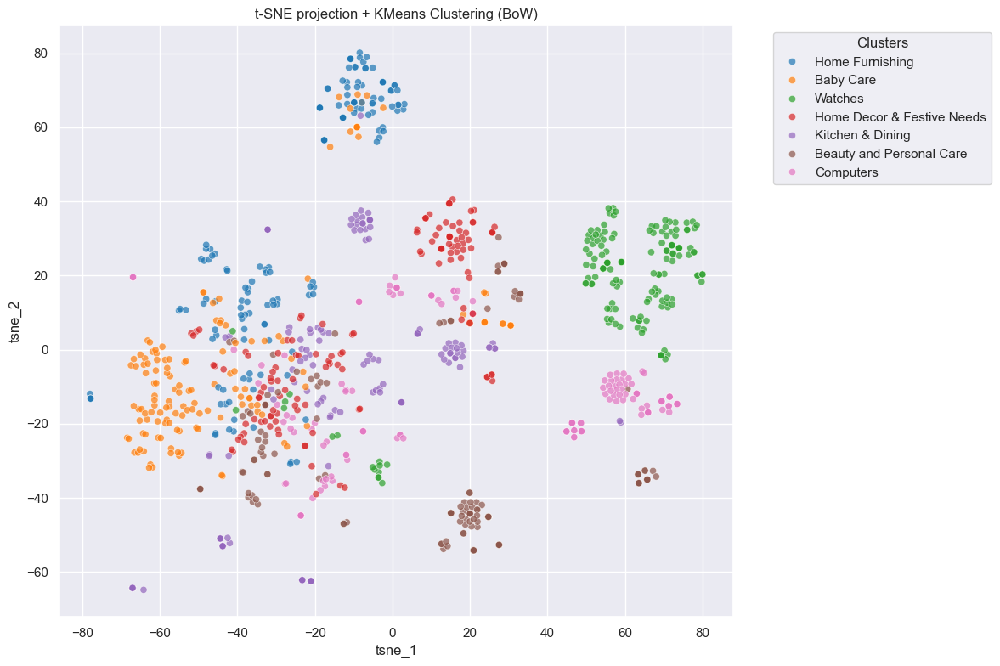

0.14166532876726898

In [60]:
bi_X_BoW = bi_vectorizer_bow.fit_transform(dataset['description_nettoyee_']).toarray()
features_retrieval_to_cluster(bi_X_BoW, dataset.copy(), methode="BoW")

## Utilisation avec methode TF-IDF

Méthode : Tf-idf


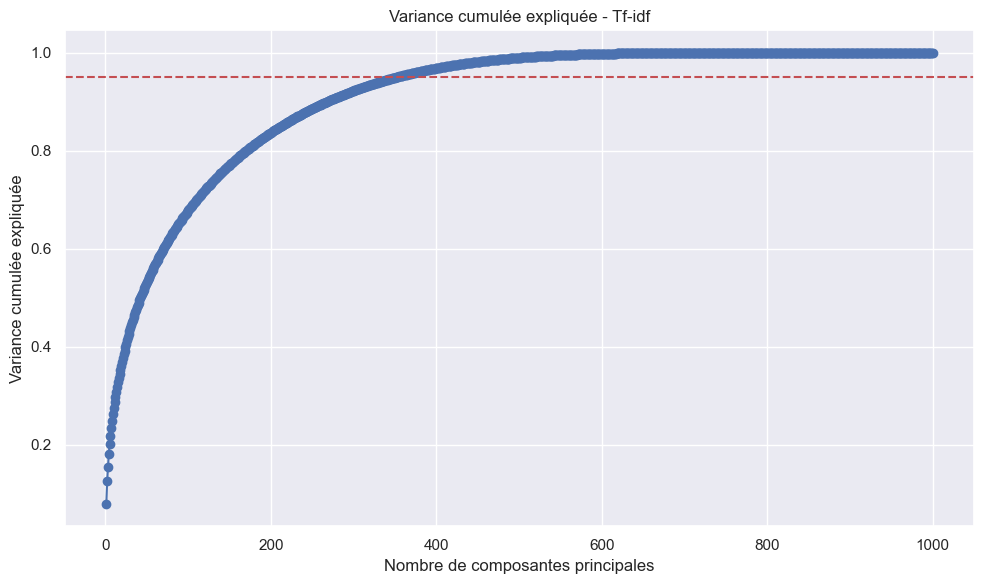

Nombre de composantes principales retenues : 351
→ 351 composantes suffisent pour 95.0% de variance.
Dimension après PCA : (1050, 351)
Dimension après t-SNE : (1050, 2)
Clusters trouvés : 7
Aucune catégorie réelle pour le calcul de l'ARI.
Score ARI : 0.2019


c:\Users\cosic\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


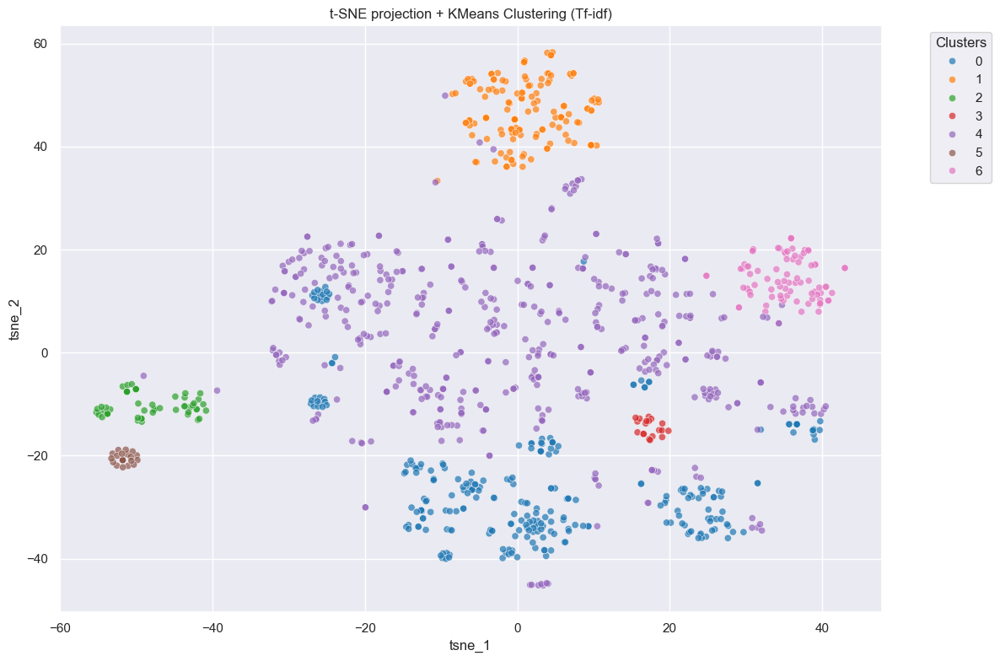

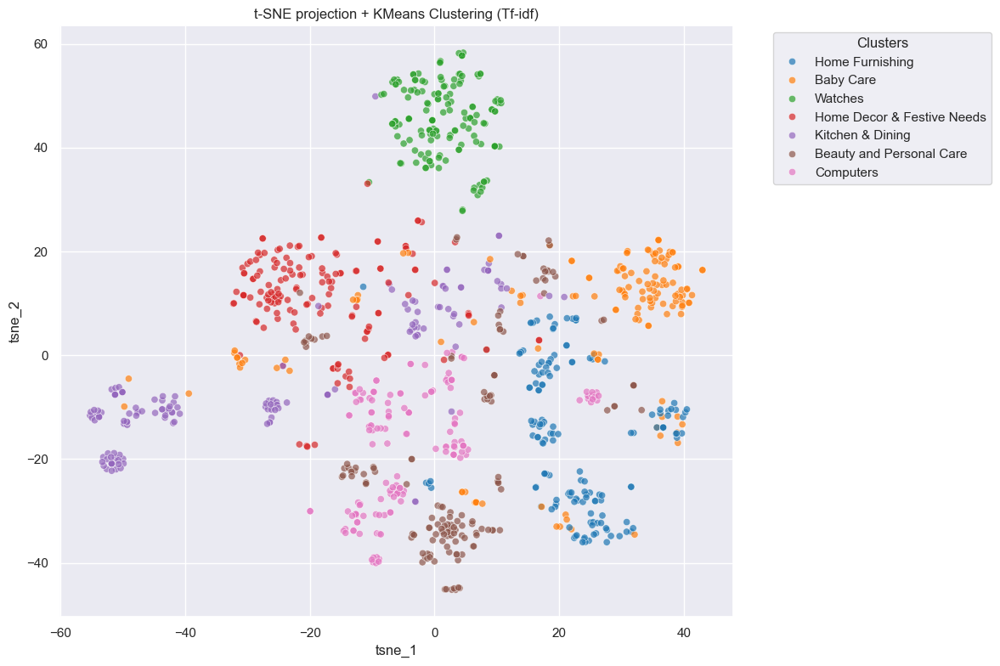

0.20188703696936774

In [61]:
# Tf-idf
X_tfidf = vectorizer_tfidf.fit_transform(dataset["description_nettoyee_"]).toarray()
features_retrieval_to_cluster(X_tfidf, dataset.copy(), methode="Tf-idf")

# Utilisation avec methode W2V

Méthode : Word2Vec


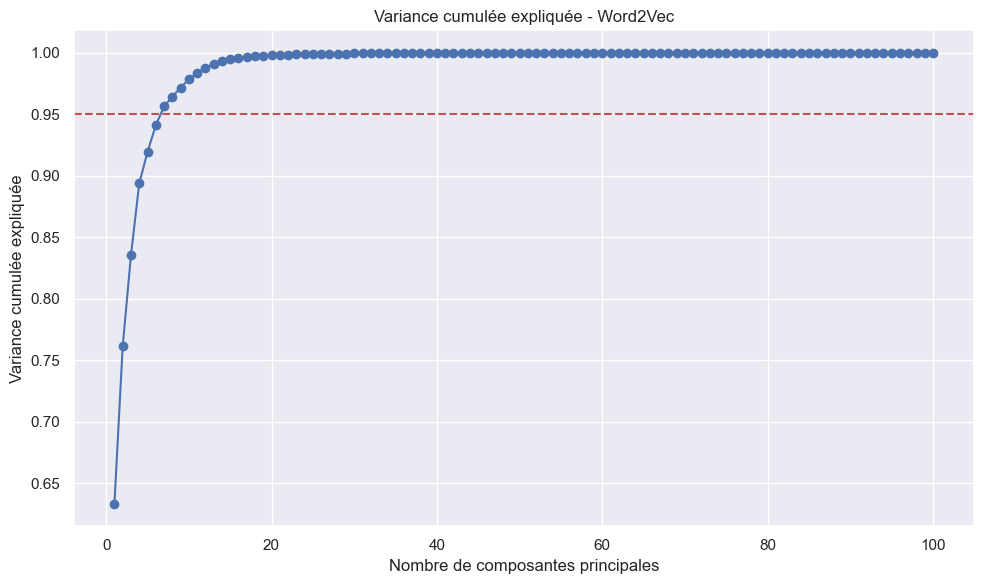

Nombre de composantes principales retenues : 7
→ 7 composantes suffisent pour 95.0% de variance.
Dimension après PCA : (1050, 7)
Dimension après t-SNE : (1050, 2)
Clusters trouvés : 7
Aucune catégorie réelle pour le calcul de l'ARI.
Score ARI : 0.2520


c:\Users\cosic\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


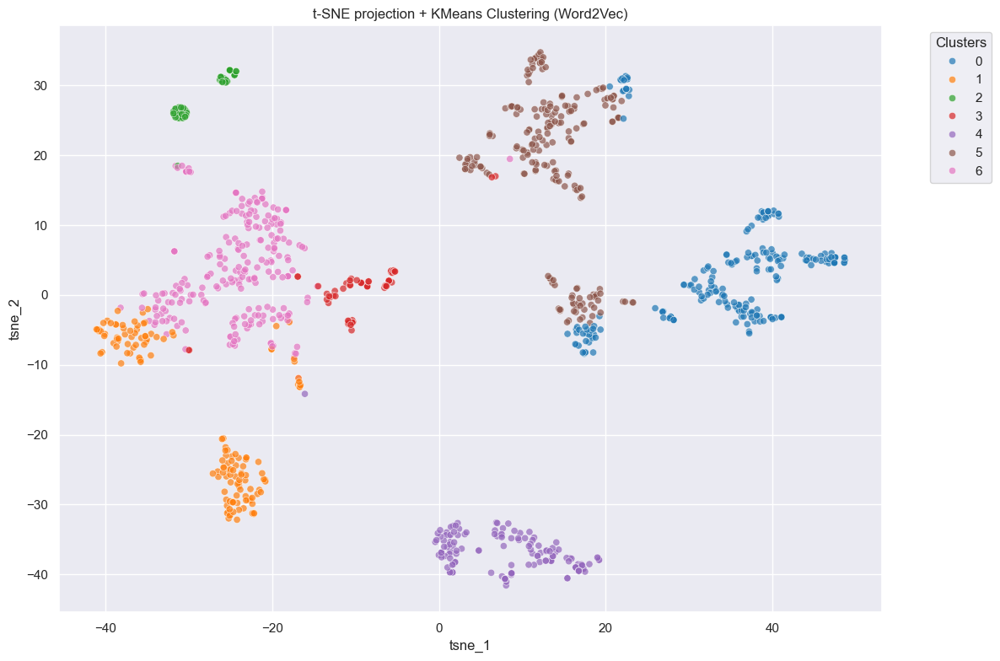

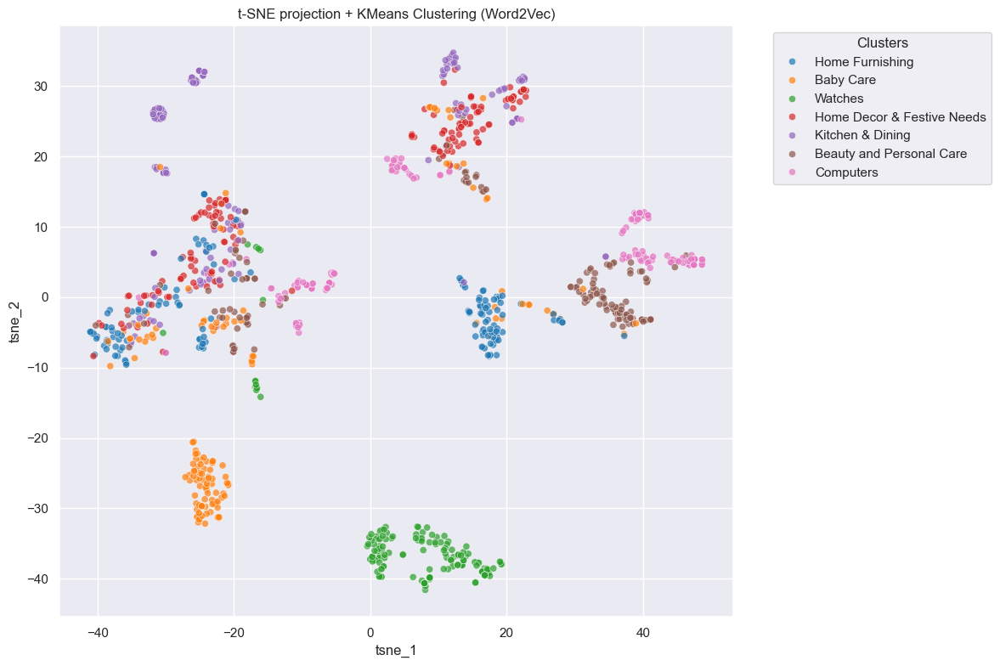

0.2519577660217322

In [62]:
# Word2Vec
X_w2v = np.vstack(dataset["embedding_w2v_"].values)
features_retrieval_to_cluster(X_w2v, dataset.copy(), methode="Word2Vec")

# Utilisation avec methode BERT

### Instnance du token bert + modele

In [63]:
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
model = BertModel.from_pretrained("bert-base-uncased")

### Embedding bert

In [64]:
def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=128)
    with torch.no_grad():
        outputs = model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()  # moyenne des tokens

In [65]:
dataset["embedding_bert_"] = dataset["description_nettoyee_"].apply(get_bert_embedding)
X_bert = np.vstack(dataset["embedding_bert_"])

Méthode : BERT


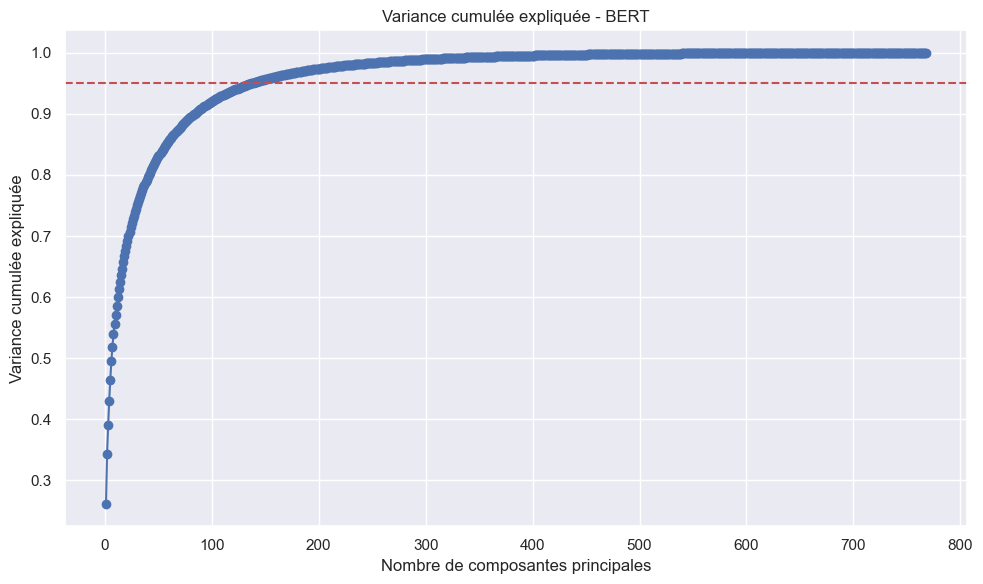

Nombre de composantes principales retenues : 138
→ 138 composantes suffisent pour 95.0% de variance.
Dimension après PCA : (1050, 138)
Dimension après t-SNE : (1050, 2)
Clusters trouvés : 7
Aucune catégorie réelle pour le calcul de l'ARI.
Score ARI : 0.1886


c:\Users\cosic\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


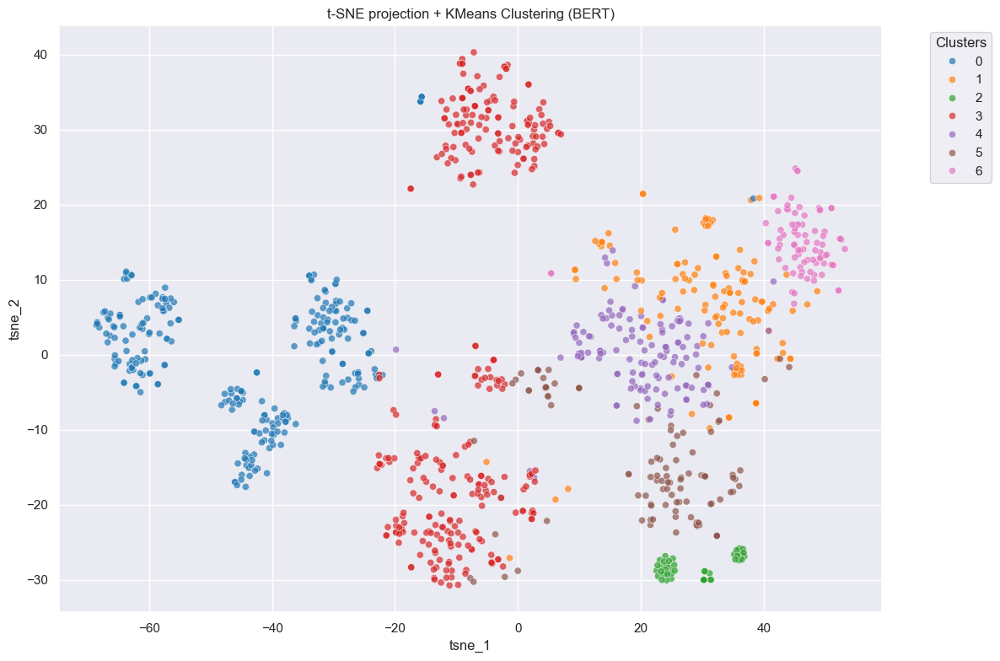

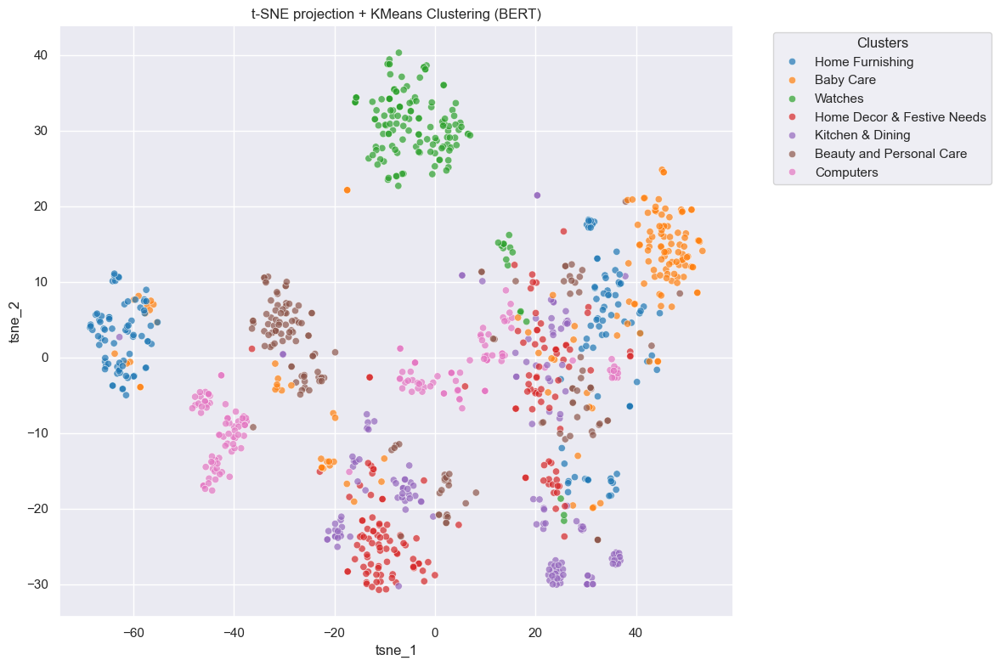

0.18862167941537236

In [66]:
features_retrieval_to_cluster(X_bert, dataset.copy(), methode="BERT")

# Utilisation avec methode USE

### Instance du modele USE

In [68]:
model_use = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")
X_use = model_use(dataset["description_nettoyee_"].tolist()).numpy()

Méthode : USE


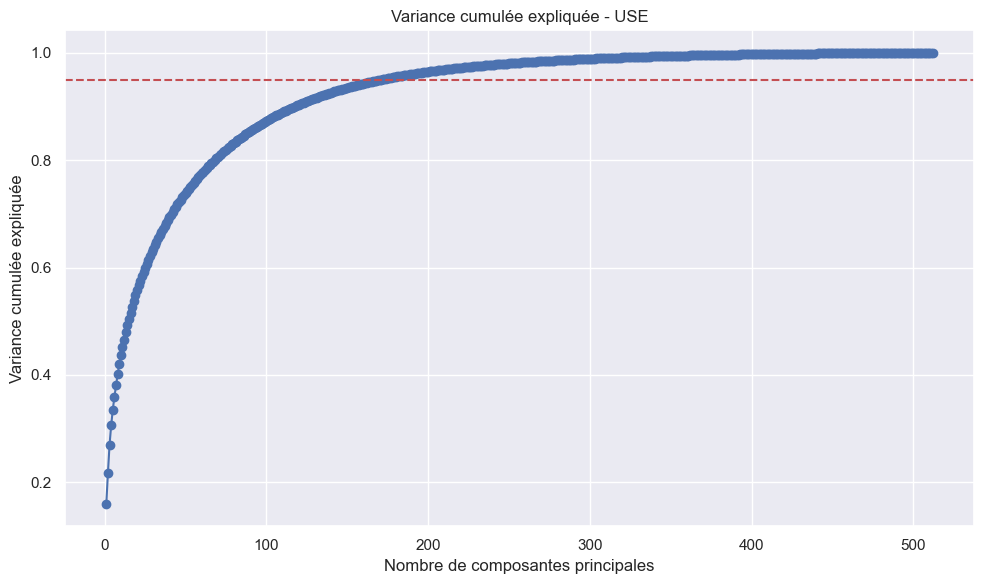

Nombre de composantes principales retenues : 171
→ 171 composantes suffisent pour 95.0% de variance.
Dimension après PCA : (1050, 171)
Dimension après t-SNE : (1050, 2)
Clusters trouvés : 7
Aucune catégorie réelle pour le calcul de l'ARI.
Score ARI : 0.3336


c:\Users\cosic\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


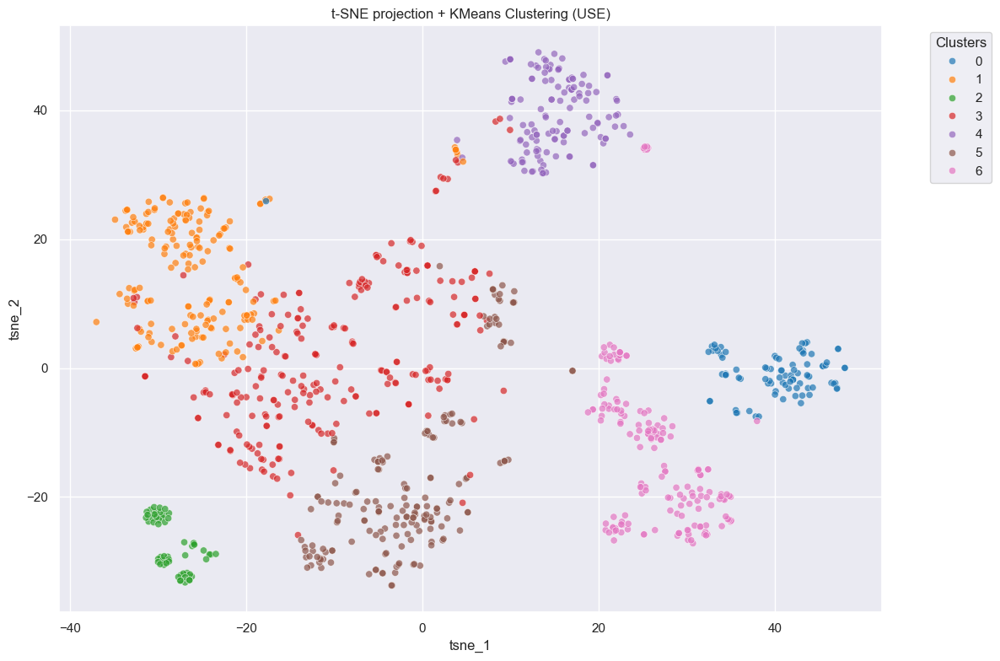

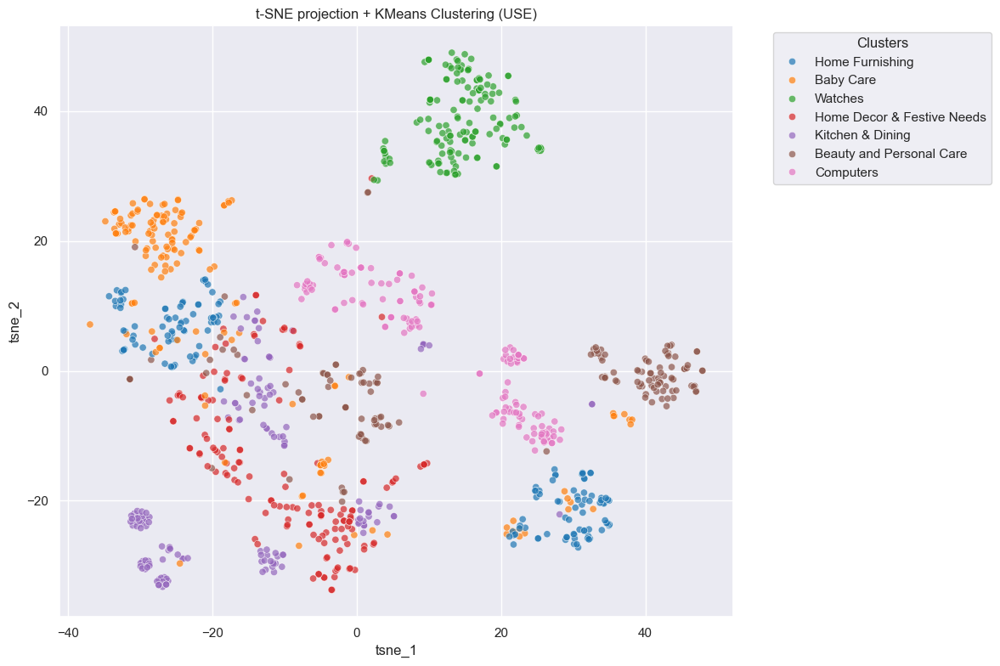

0.3335684894020739

In [69]:
features_retrieval_to_cluster(X_use, dataset.copy(), methode="USE")

## Enregistrons les resultats dans un tableau pour faire des comparratifs

In [70]:
def save_results(methode, ari, tableau):
    tableau.append({"Méthode": methode, "ARI": round(ari, 4)})
    return tableau

In [71]:
resultats_ari = []

Méthode : Tf-idf


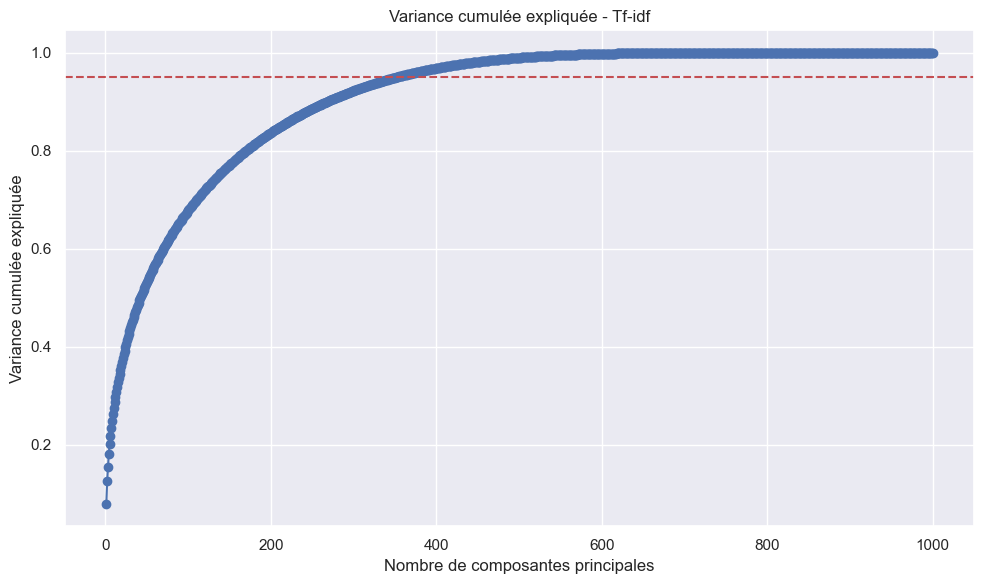

Nombre de composantes principales retenues : 351
→ 351 composantes suffisent pour 95.0% de variance.
Dimension après PCA : (1050, 351)
Dimension après t-SNE : (1050, 2)
Clusters trouvés : 7
Aucune catégorie réelle pour le calcul de l'ARI.
Score ARI : 0.2019


c:\Users\cosic\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


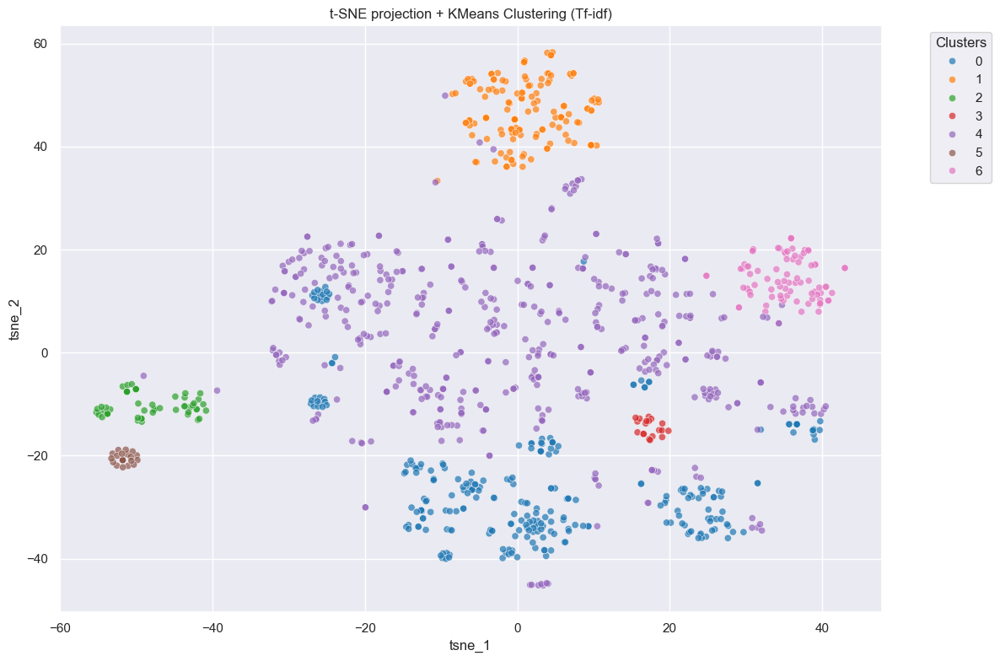

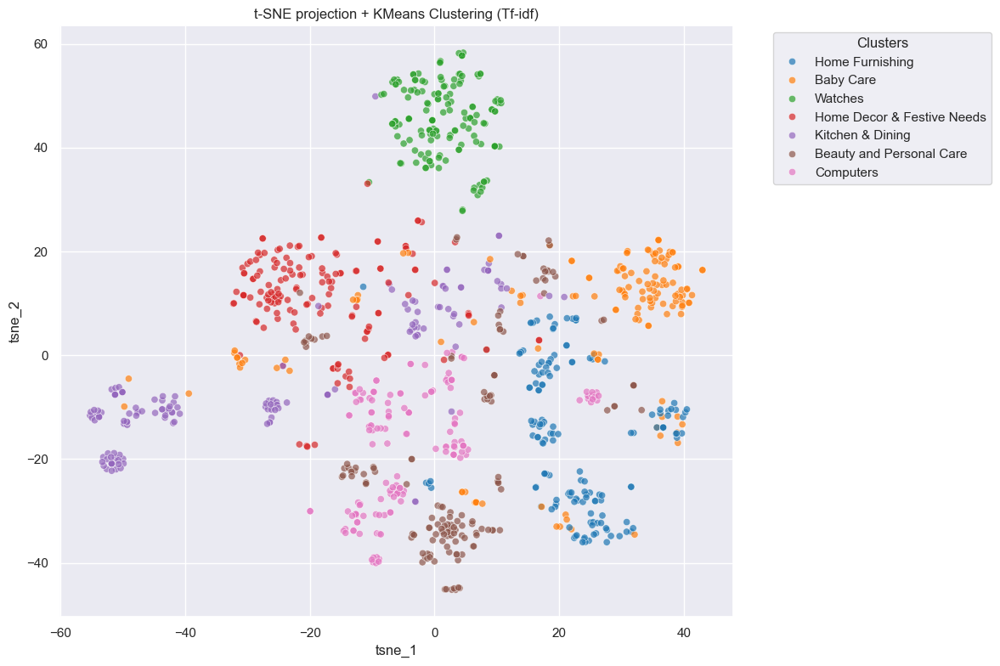

In [72]:
ari_tfidf = features_retrieval_to_cluster(X_tfidf, dataset.copy(), methode="Tf-idf")
resultats_ari = save_results("Tf-idf", ari_tfidf, resultats_ari)

Méthode : Word2Vec


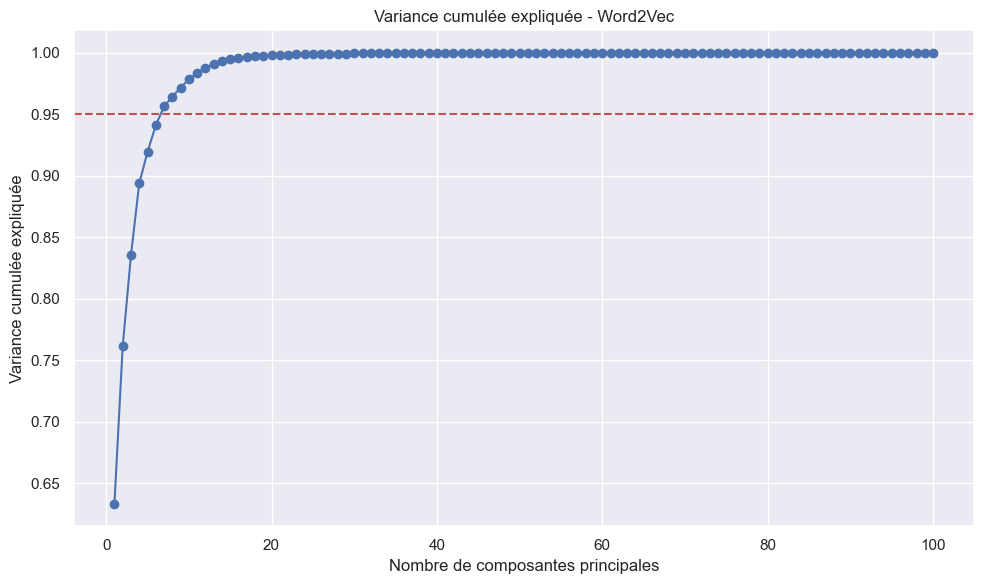

Nombre de composantes principales retenues : 7
→ 7 composantes suffisent pour 95.0% de variance.
Dimension après PCA : (1050, 7)
Dimension après t-SNE : (1050, 2)
Clusters trouvés : 7
Aucune catégorie réelle pour le calcul de l'ARI.
Score ARI : 0.2520


c:\Users\cosic\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


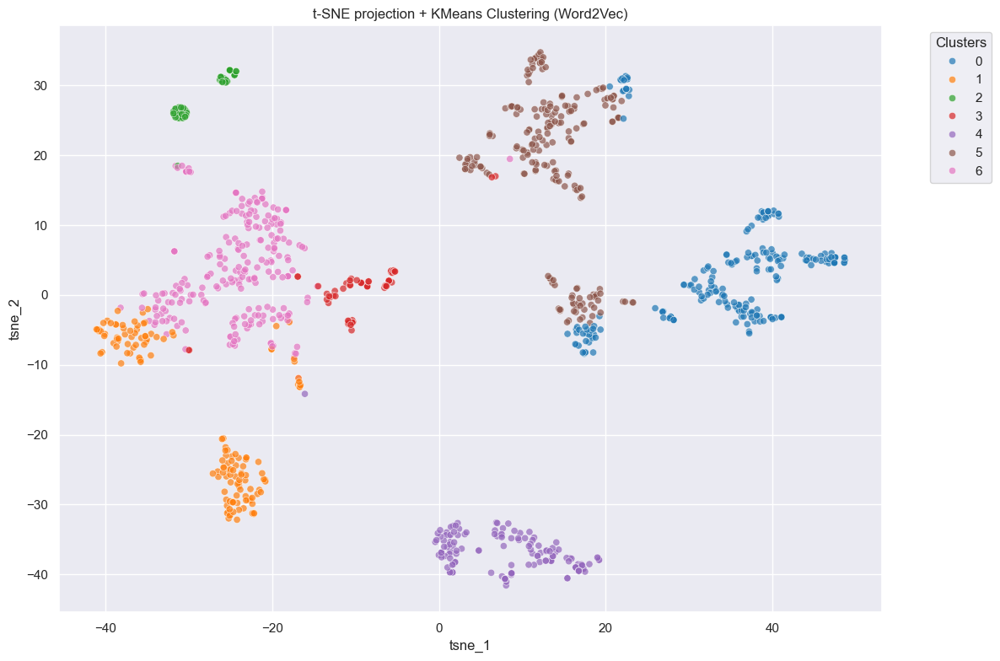

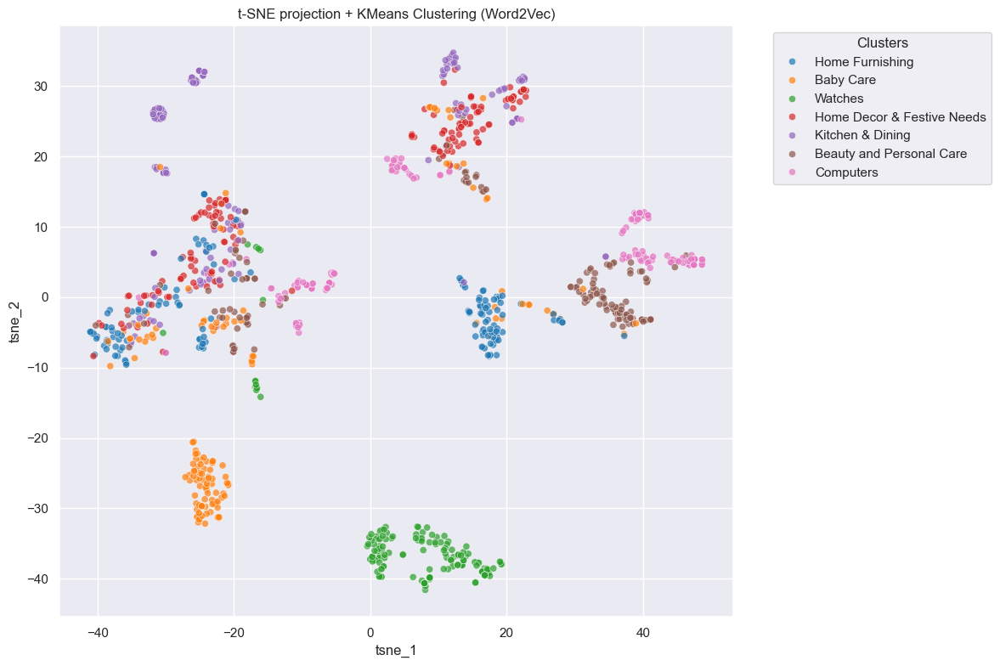

In [73]:
ari_w2v = features_retrieval_to_cluster(X_w2v, dataset.copy(), methode="Word2Vec")
resultats_ari = save_results("Word2Vec", ari_w2v, resultats_ari)

Méthode : BERT


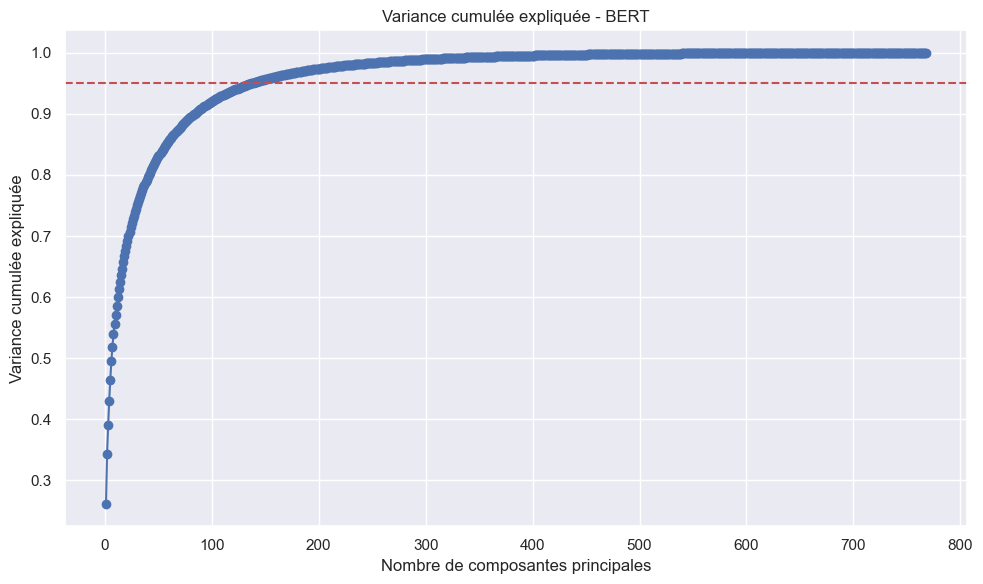

Nombre de composantes principales retenues : 138
→ 138 composantes suffisent pour 95.0% de variance.
Dimension après PCA : (1050, 138)
Dimension après t-SNE : (1050, 2)
Clusters trouvés : 7
Aucune catégorie réelle pour le calcul de l'ARI.
Score ARI : 0.1886


c:\Users\cosic\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


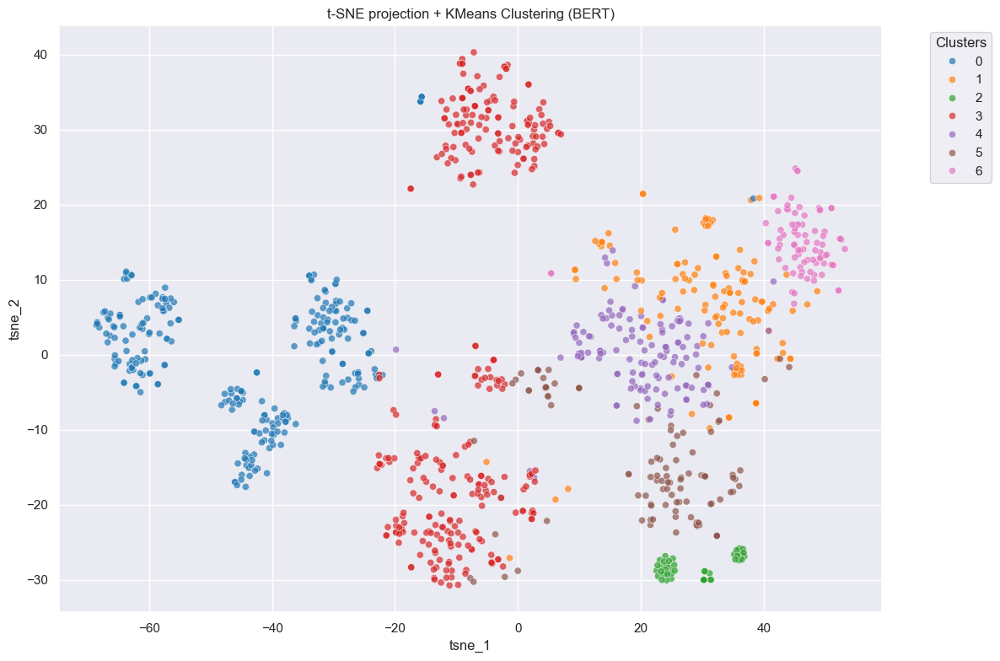

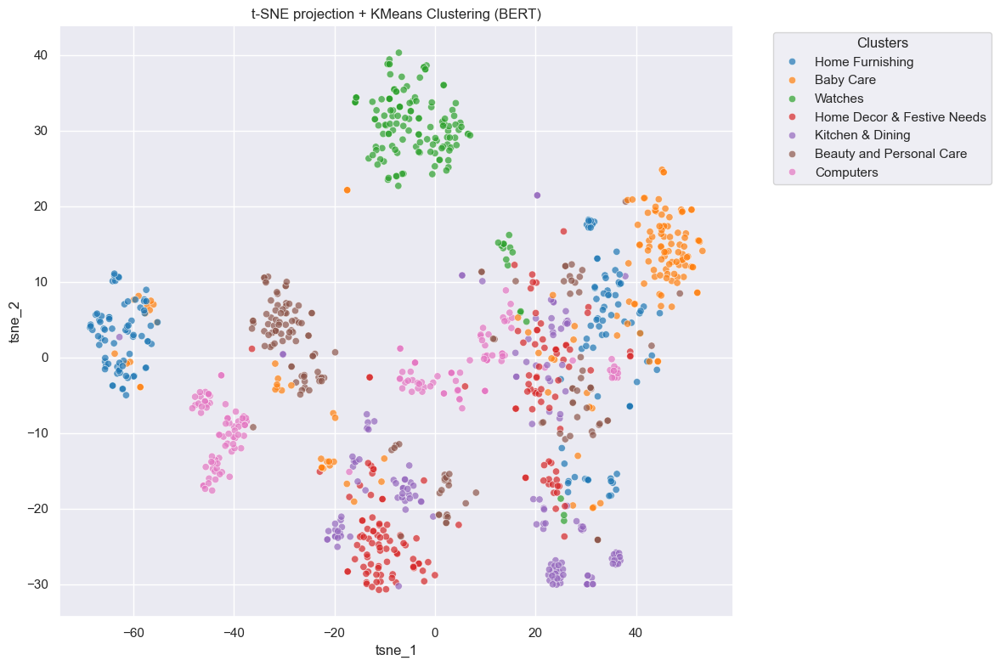

In [74]:
ari_bert = features_retrieval_to_cluster(X_bert, dataset.copy(), methode="BERT")
resultats_ari = save_results("BERT", ari_bert, resultats_ari)

Méthode : USE


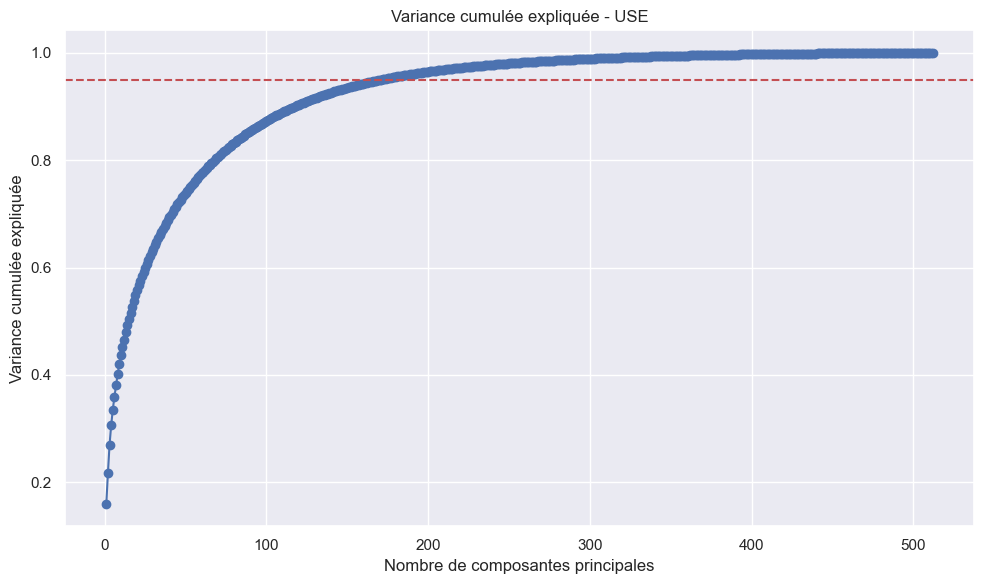

Nombre de composantes principales retenues : 171
→ 171 composantes suffisent pour 95.0% de variance.
Dimension après PCA : (1050, 171)
Dimension après t-SNE : (1050, 2)
Clusters trouvés : 7
Aucune catégorie réelle pour le calcul de l'ARI.
Score ARI : 0.3336


c:\Users\cosic\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


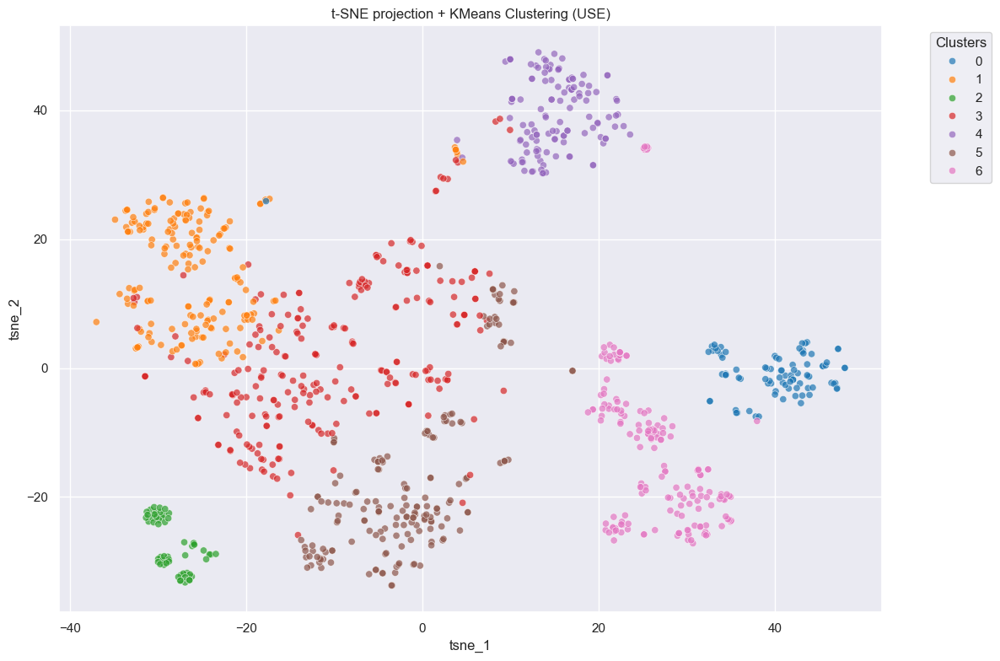

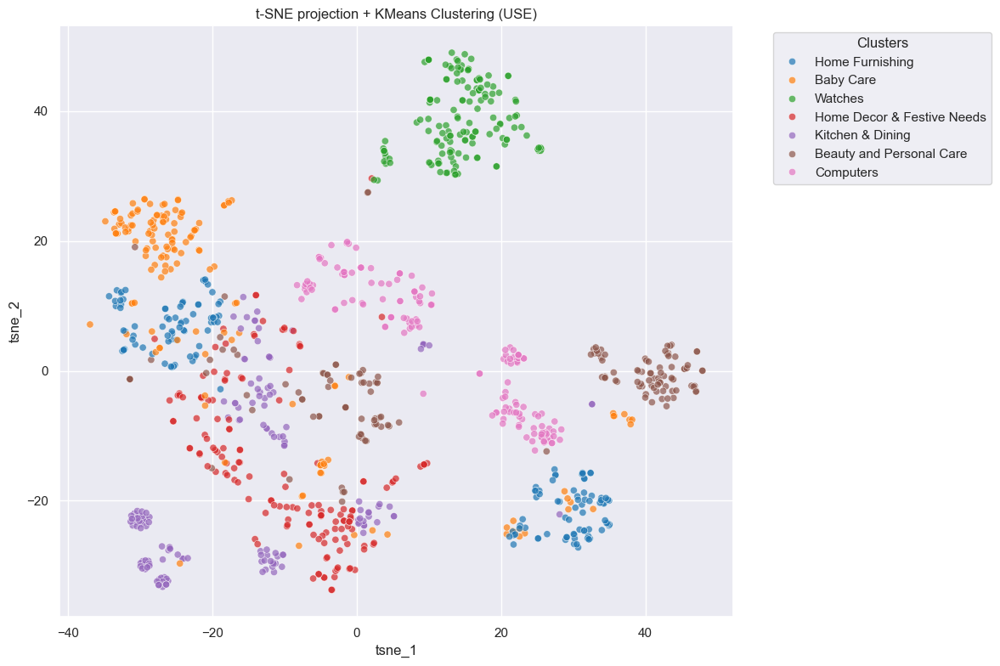

In [75]:
ari_use = features_retrieval_to_cluster(X_use, dataset.copy(), methode="USE")
resultats_ari = save_results("USE", ari_use, resultats_ari)

In [76]:
# Conversion en DataFrame
df_resultats = pd.DataFrame(resultats_ari)
df_resultats.sort_values(by="ARI", ascending=False, inplace=True)
print(df_resultats)

    Méthode     ARI
3       USE  0.3336
1  Word2Vec  0.2520
0    Tf-idf  0.2019
2      BERT  0.1886


## Visualisation du tableau 

C:\Users\cosic\AppData\Local\Temp\ipykernel_25904\4175095148.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_resultats, x="ARI", y="Méthode", palette="viridis")


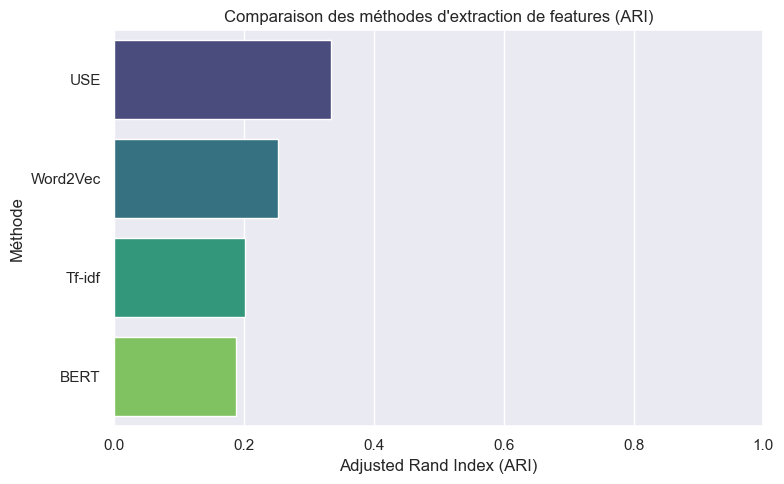

In [77]:
plt.figure(figsize=(8, 5))
sns.barplot(data=df_resultats, x="ARI", y="Méthode", palette="viridis")
plt.title("Comparaison des méthodes d'extraction de features (ARI)")
plt.xlabel("Adjusted Rand Index (ARI)")
plt.ylabel("Méthode")
plt.xlim(0, 1)
plt.tight_layout()
plt.show()

# A present nous allons tenter d'evaluer la faisabilité de regrouper automatiquement les articles à partir de leurs images uniquement

In [78]:
#%pip install opencv-python
import cv2

In [79]:
from matplotlib.image import imread

In [80]:
img_path = "../Source/Flipkart/Images"

In [81]:
def load_img(name, folder=img_path, size=(224, 224), grey=False):
    """
    Load an image from the specified folder.
    
    Args:
        name (str): The name of the image file.
        folder (str): The folder where the image is located.
        
    Returns:
        np.ndarray: The loaded image as a numpy array.
    """
    p = os.path.join(folder, name)
    if not os.path.exists(p):
        print(f"Image {name} not found in {folder}.")
        return None
    img = cv2.imread(p)
    if grey:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return cv2.resize(img, size)

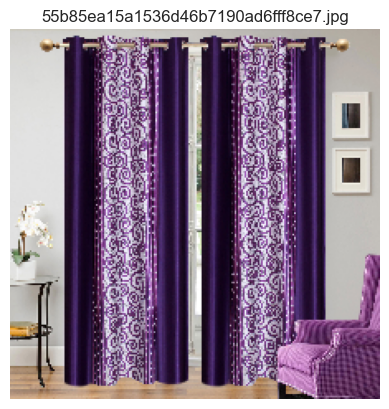

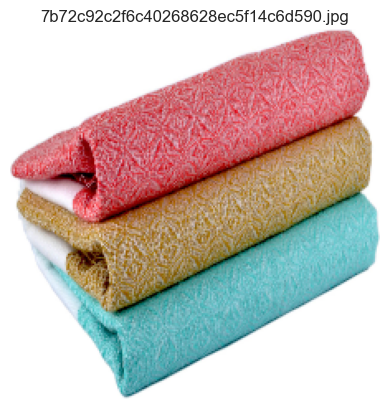

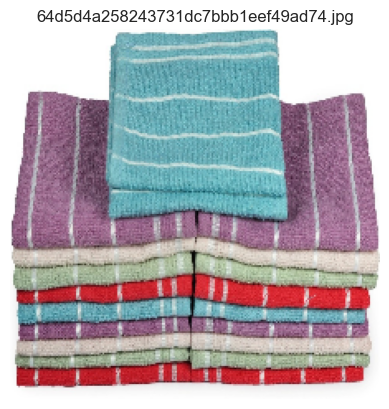

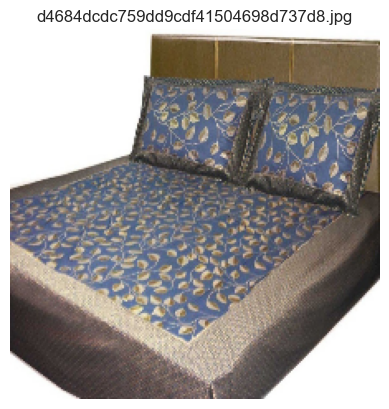

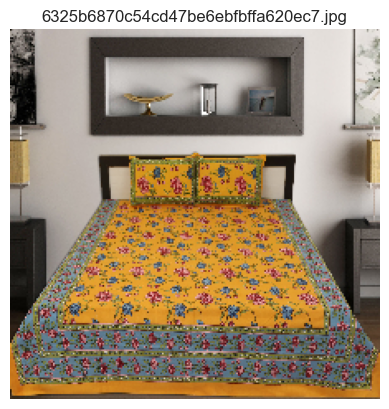

In [82]:
for name in dataset['image'].dropna().unique()[:5]:
    img = load_img(name)
    if img is not None:
        #plt.figure(figsize=(4, 4))
        plt.imshow(img)
        plt.axis('off')
        plt.title(name)
        plt.show()

## Ok nos imags se chargent bien correctement

In [83]:
def display_image_histograms(product_name, cv_img, color="tab:red"):
    # Define figure
    figure = plt.figure(figsize=(20, 5))
    plt.title(product_name + " " + str(cv_img.shape), fontweight="bold", pad=50)
    plt.axis('off')

    # Add histogram
    figure.add_subplot(1, 3, 1)
    plt.axis('off')
    plt.imshow(cv_img, cmap='gray')

    # Add histogram
    figure.add_subplot(1, 3, 2)
    plt.title("Histogram")
    sns.histplot(cv_img.flatten(), bins=256, color=color)
    plt.xlabel('Gray level')
    plt.ylabel('Pixels')

    # Add normalized and cumulative histogram
    figure.add_subplot(1, 3, 3)
    plt.title("Cumulative and normalized histogram")
    sns.histplot(cv_img.flatten(), bins=256, stat='density', cumulative=True, color=color)
    plt.xlabel('Gray level')
    plt.ylabel('Pixels')

    plt.tight_layout()
    plt.show()

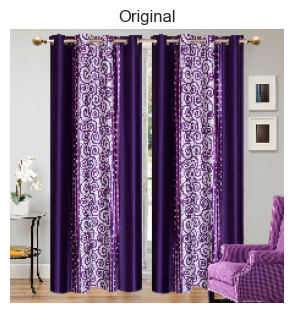

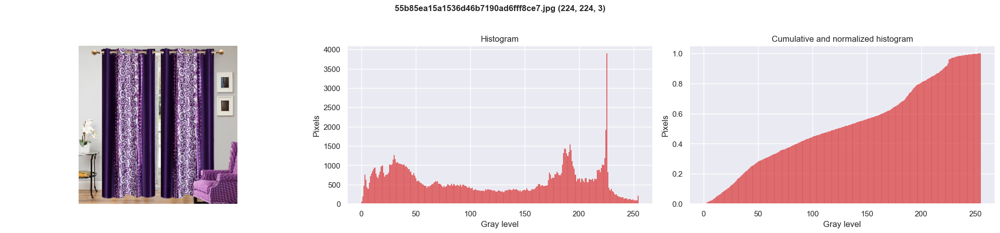

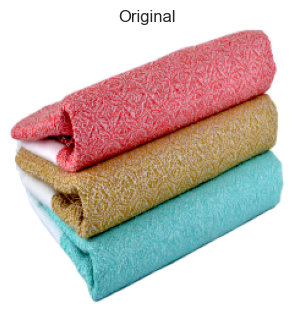

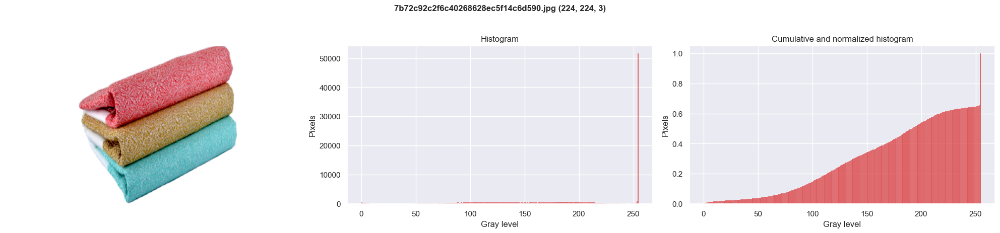

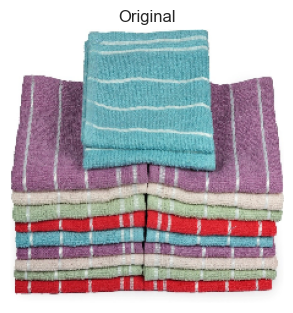

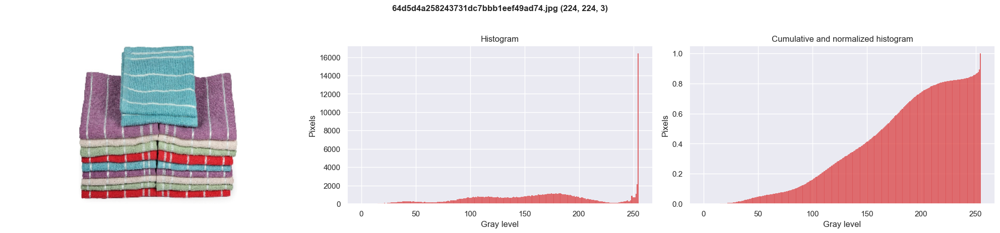

In [84]:
for name in dataset['image'].dropna().unique()[:3]:
    img = load_img(name)
    if img is not None:
        plt.figure(figsize=(12, 8))
        plt.subplot(2, 3, 1)
        plt.imshow(img)
        plt.title("Original")
        plt.axis('off')

        display_image_histograms(name, img)

# Nous allons commencer par utiliser un algorithme d'extraction de type ORB

In [85]:
from sklearn.cluster import MiniBatchKMeans

In [86]:
orb = cv2.ORB_create(nfeatures=1000)

descriptors_list = []
for name in dataset['image']:
    img = load_img(name, grey=True)
    if img is None:
        descriptors_list.append(None)
        continue
    keypoints, descriptors = orb.detectAndCompute(img, None)
    descriptors_list.append(descriptors)

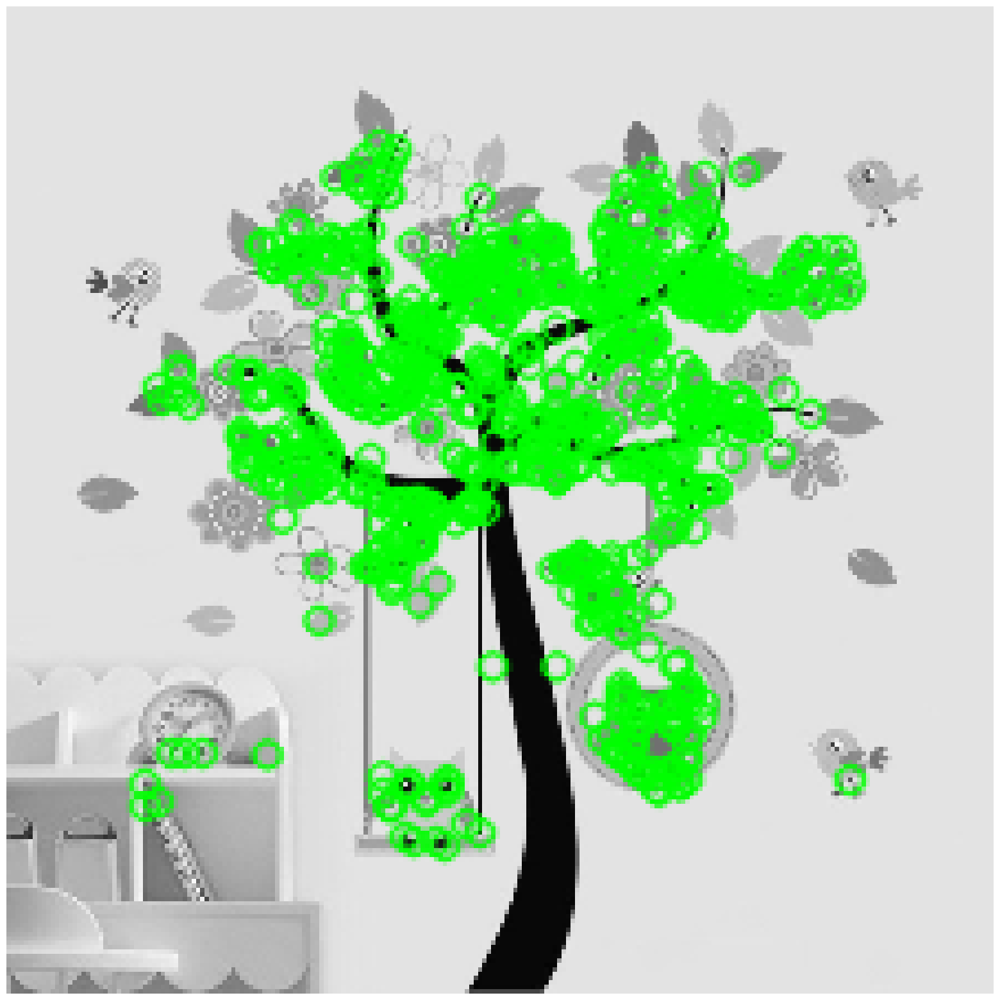

In [87]:
result_img = cv2.drawKeypoints(img, keypoints, None, color=(0, 255, 0), flags=0)
plt.figure(figsize=(20, 20))
plt.imshow(result_img)
plt.axis("off")
plt.show()

In [88]:
all_descriptors = np.vstack([d for d in descriptors_list if d is not None])
k_bovw = 300 # nombre de mots visuels
bowv_kmeans = MiniBatchKMeans(n_clusters=k_bovw, random_state=42, batch_size=1000)
bowv_kmeans.fit(all_descriptors)

c:\Users\cosic\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1955: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 1536 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


MiniBatchKMeans(batch_size=1000, n_clusters=300, random_state=42)

In [89]:
def code_bovw(descriptors, kmeans_model, k):
    """
    Encode les descripteurs d'une image en utilisant le modèle KMeans pour créer un histogramme de mots visuels.
    
    Args:
        descriptors (np.ndarray): Descripteurs de l'image.
        kmeans_model (MiniBatchKMeans): Modèle KMeans entraîné.
        k (int): Nombre de clusters (mots visuels).
        
    Returns:
        np.ndarray: Histogramme de mots visuels.
    """
    if descriptors is None:
        return np.zeros(k)
    
    # Prédire les mots visuels pour les descripteurs
    words = kmeans_model.predict(descriptors)
    
    # Créer un histogramme
    hist, _ = np.histogram(words, bins=np.arange(k + 1), density=True)
    
    return hist / hist.sum()

In [90]:
X_bovw = np.vstack([code_bovw(d, bowv_kmeans, k_bovw) for d in descriptors_list])

### Histogramme des mots visuels

C:\Users\cosic\AppData\Local\Temp\ipykernel_25904\2391282558.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=data, x=x, y=y, order=order, palette=palette)
C:\Users\cosic\AppData\Local\Temp\ipykernel_25904\2391282558.py:5: UserWarning: 
The palette list has fewer values (1) than needed (300) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=data, x=x, y=y, order=order, palette=palette)


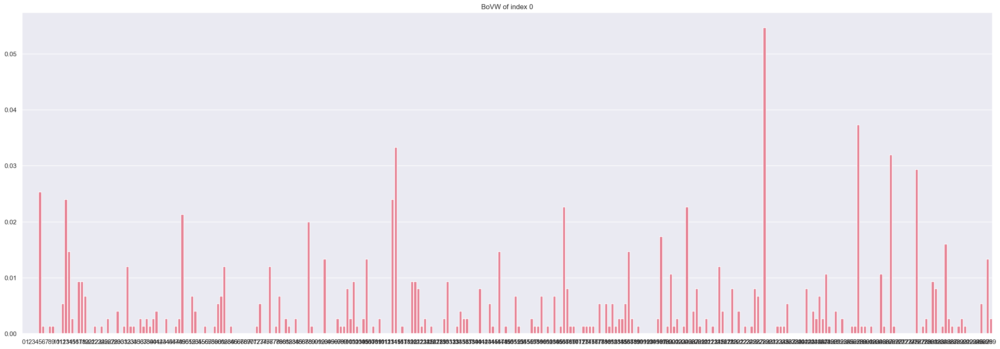

In [91]:
idx=0
display_barplot(x=[*range(len(X_bovw[idx]))], y=X_bovw[idx], figsize=(30, 10),
                title="BoVW of index "+str(idx), palette=sns.color_palette("husl", 1))

## Ici notre X_bovw joue le meme role que nos matrices texte, on pourra donc le passer dans la fonction features_retrieval_to_cluster()

Méthode : ORB-BoVW


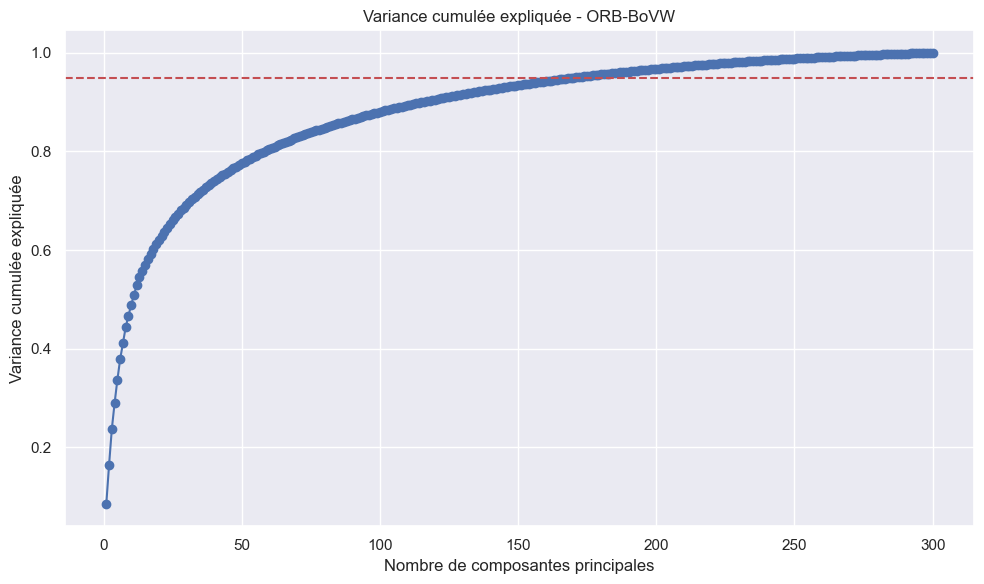

Nombre de composantes principales retenues : 171
→ 171 composantes suffisent pour 95.0% de variance.
Dimension après PCA : (1050, 171)
Dimension après t-SNE : (1050, 2)
Clusters trouvés : 7
Aucune catégorie réelle pour le calcul de l'ARI.
Score ARI : 0.0169


c:\Users\cosic\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


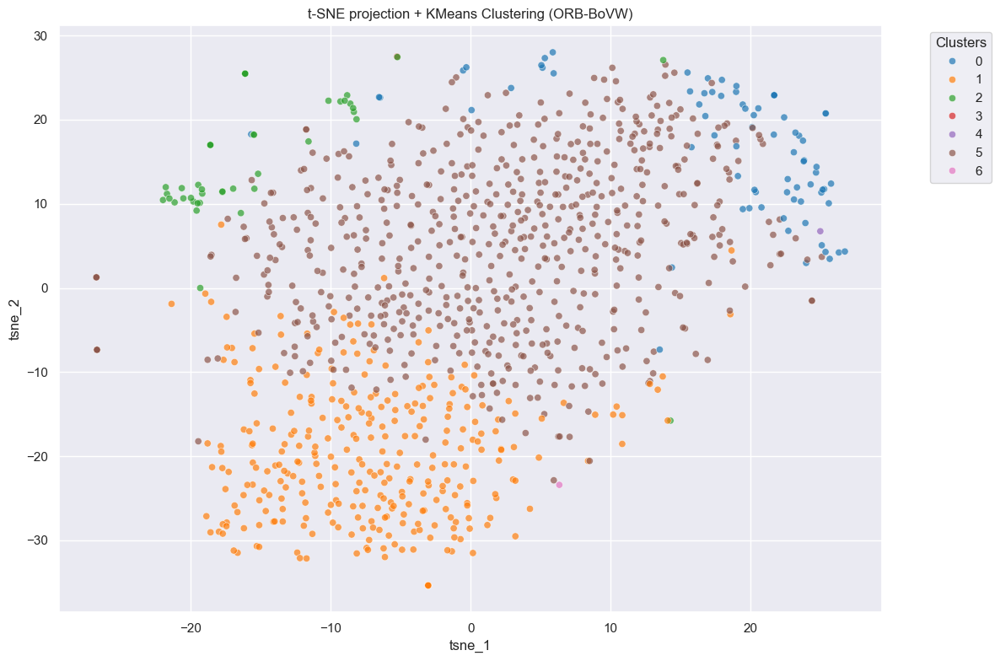

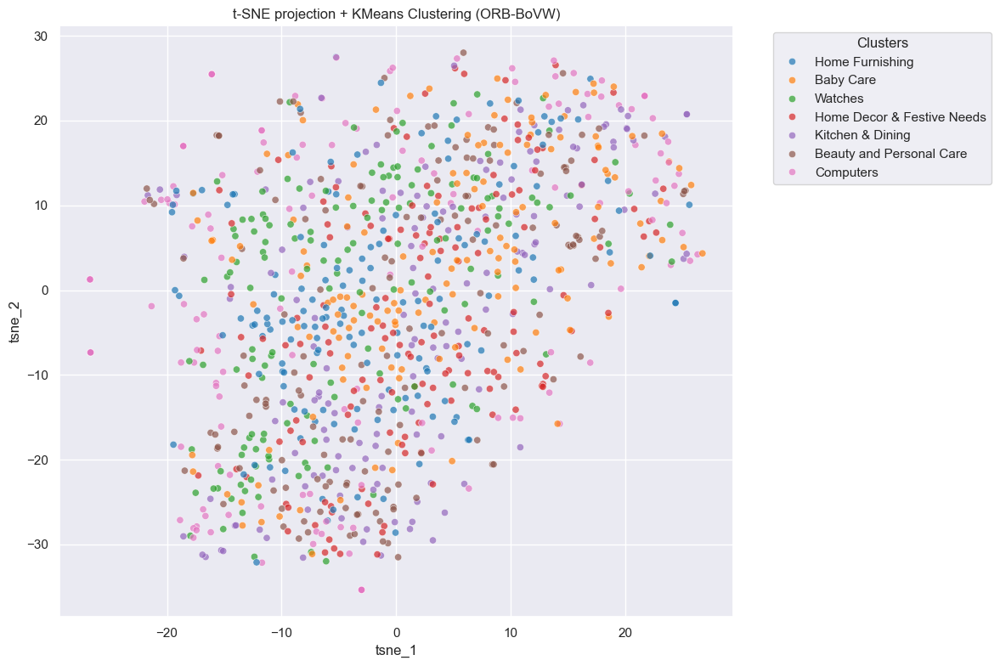

In [92]:
ari_orb = features_retrieval_to_cluster(X_bovw, dataset.copy(), methode="ORB-BoVW")
resultats_ari = save_results("ORB-BoVW", ari_orb, resultats_ari)

In [93]:
resultats_ari

[{'Méthode': 'Tf-idf', 'ARI': 0.2019},
 {'Méthode': 'Word2Vec', 'ARI': 0.252},
 {'Méthode': 'BERT', 'ARI': 0.1886},
 {'Méthode': 'USE', 'ARI': 0.3336},
 {'Méthode': 'ORB-BoVW', 'ARI': 0.0169}]

In [94]:
df_res = pd.DataFrame(resultats_ari).sort_values("ARI", ascending=False)
print(df_res)

    Méthode     ARI
3       USE  0.3336
1  Word2Vec  0.2520
0    Tf-idf  0.2019
2      BERT  0.1886
4  ORB-BoVW  0.0169


C:\Users\cosic\AppData\Local\Temp\ipykernel_25904\1344167723.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_res, x="ARI", y="Méthode", palette="viridis")


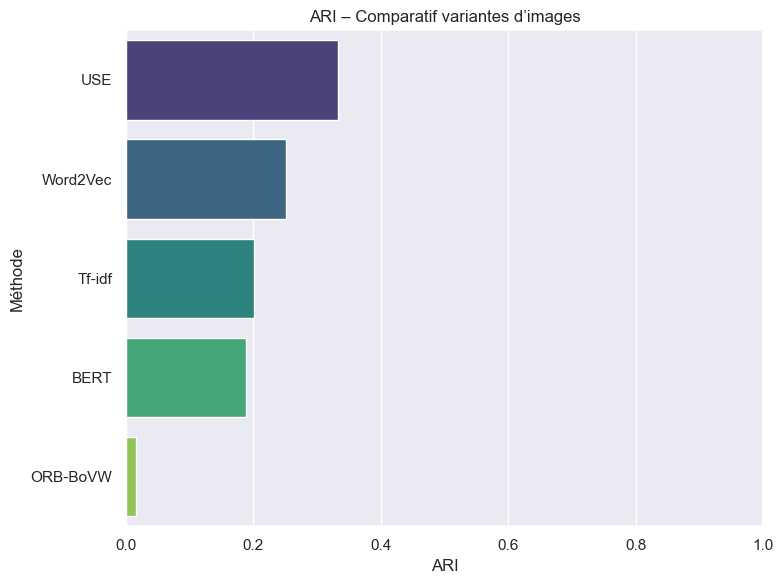

In [95]:
plt.figure(figsize=(8,6))
sns.barplot(data=df_res, x="ARI", y="Méthode", palette="viridis")
plt.title("ARI – Comparatif variantes d’images")
plt.xlim(0, 1); plt.tight_layout(); plt.show()

# Suite avec la classification supervisee dans le notebook : supervised_classification